In [1]:
from astropy.io import fits
import matplotlib.pyplot as plt
import lightkurve as lk
import numpy as np
from astropy.timeseries import LombScargle
from pylab import rc
from matplotlib import gridspec
from matplotlib import transforms
from matplotlib import colors
from scipy.stats import gaussian_kde
from pylab import *
rcParams['font.family'] = 'serif'
rcParams['font.sans-serif'] = ['Times']
from matplotlib.backends.backend_pdf import PdfPages

In [13]:
!pip install --upgrade lightkurve

     |████████████████████████████████| 247 kB 12.4 MB/s eta 0:00:01
     |████████████████████████████████| 98 kB 7.3 MB/s  eta 0:00:01
     |████████████████████████████████| 11.3 MB 13.6 MB/s eta 0:00:01
     |████████████████████████████████| 41 kB 334 kB/s  eta 0:00:01
     |████████████████████████████████| 10.7 MB 8.7 MB/s eta 0:00:01
     |████████████████████████████████| 23.2 MB 25.1 MB/s eta 0:00:01    |████                            | 2.8 MB 20.1 MB/s eta 0:00:02
     |████████████████████████████████| 746 kB 13.8 MB/s eta 0:00:01


  Created wheel for memoization: filename=memoization-0.4.0-py3-none-any.whl size=50456 sha256=1918cba852d8e05a6cab03bce1e148516c8fbf39a57f855b270145f2ca10b0ed
  Stored in directory: /home/nwal/.cache/pip/wheels/38/f7/65/161985e7311dd484a23b3a5c9149995dbf11db6cede602e7ef
Successfully built memoization
ERROR: pyts 0.11.0 has requirement numba>=0.48.0, but you'll have numba 0.45.1 which is incompatible.
  Attempting uninstall: uncertainties
    Found existing installation: uncertainties 3.1.2
    Uninstalling uncertainties-3.1.2:
      Successfully uninstalled uncertainties-3.1.2
  Attempting uninstall: pandas
    Found existing installation: pandas 0.25.1
    Uninstalling pandas-0.25.1:
      Successfully uninstalled pandas-0.25.1
  Attempting uninstall: astropy
    Found existing installation: astropy 4.0
    Uninstalling astropy-4.0:
      Successfully uninstalled astropy-4.0
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.21.3
    Uninstalling sci

In [2]:
def foldMeth(timeArray, period):
    phases = []
    for el in timeArray:
        passed = int(el/period)
        leftover = el - (passed*period)
        phase = leftover/period
        phases.append(phase)
    return np.array(phases)

In [2]:
search_result = lk.search_lightcurvefile('GD356')
search_result

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: LightkurveDeprecationWarning: The search_lightcurvefile function is deprecated and may be removed in a future version.
        Use search_lightcurve() instead.
  """Entry point for launching an IPython kernel.
/home/nwal/anaconda3/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/home/nwal/anaconda3/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes


#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 16,2019,SPOC,120,274239484,0.0
1,TESS Sector 16,2019,TESS-SPOC,1800,274239484,0.0
2,TESS Sector 23,2020,SPOC,120,274239484,0.0
3,TESS Sector 23,2020,TESS-SPOC,1800,274239484,0.0
4,TESS Sector 24,2020,SPOC,120,274239484,0.0
5,TESS Sector 24,2020,TESS-SPOC,1800,274239484,0.0
6,TESS Sector 25,2020,SPOC,120,274239484,0.0
7,TESS Sector 25,2020,TESS-SPOC,1800,274239484,0.0
8,TESS Sector 26,2020,SPOC,120,274239484,0.0


In [5]:

print('total',len(search_result[0].download(quality_bitmask=None).PDCSAP_FLUX))
print('good',len(search_result[0].download(quality_bitmask=None).PDCSAP_FLUX[search_result[0].download(quality_bitmask=None).PDCSAP_FLUX.quality==0]))
#print('total',len(search_result[2].download().PDCSAP_FLUX))
#print('good',len(search_result[2].download().PDCSAP_FLUX[search_result[2].download().PDCSAP_FLUX.quality==0]))

ValueError: ``time_column`` should be provided since the default Table readers are being used.

In [3]:
lc = search_result[0].download()
type(lc)

lightkurve.lightcurve.TessLightCurve

In [12]:
help(lc)

Help on TessLightCurve in module lightkurve.lightcurve object:

class TessLightCurve(LightCurve)
 |  TessLightCurve(data=None, *args, time=None, flux=None, flux_err=None, **kwargs)
 |  
 |  Subclass of :class:`LightCurve <lightkurve.lightcurve.LightCurve>`
 |  to represent data from NASA's TESS mission.
 |  
 |  Method resolution order:
 |      TessLightCurve
 |      LightCurve
 |      QTimeSeries
 |      astropy.timeseries.sampled.TimeSeries
 |      astropy.timeseries.core.BaseTimeSeries
 |      astropy.table.table.QTable
 |      astropy.table.table.Table
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  to_fits(self, path=None, overwrite=False, flux_column_name='FLUX', aperture_mask=None, **extra_data)
 |      Writes the KeplerLightCurve to a FITS file.
 |      
 |      Parameters
 |      ----------
 |      path : string, default None
 |          File path, if `None` returns an astropy.io.fits.HDUList object.
 |      overwrite : bool
 |          Whether or not to overwr

In [18]:
import pandas as pd
data1 = pd.read_csv('ASSASN_BH.csv', delimiter=',', names=['time', 'flux', 'err'])
timeBH = data1['time']
fluxBH = data1['flux']
errBH = data1['err']
lc = lk.lightcurve.TessLightCurve(time = timeBH, flux=fluxBH, flux_err=errBH)
type(lc)

lightkurve.lightcurve.TessLightCurve

In [9]:
lk.LightCurve.read('ASSASN_BH.dat', format='aaaa')

IORegistryError: No reader defined for format 'aaaa' and class 'LightCurve'.

The available formats are:

  Format   Read Write Auto-identify
---------- ---- ----- -------------
     cdips  Yes    No            No
   everest  Yes    No            No
     k2sff  Yes    No            No
    kepler  Yes    No            No
kepseismic  Yes    No            No
    pathos  Yes    No            No
       qlp  Yes    No            No
     tasoc  Yes    No            No
      tess  Yes    No            No

In [11]:
from astropy.timeseries import TimeSeries
ts = TimeSeries.read('ASSASN_BH.dat', format='ascii',
                     time_column='date')

ValueError: No time format was given, and the input is not unique

In [8]:
lk.LightCurve.read().help()

TypeError: read() missing 1 required positional argument: 'filename'

In [44]:
search_result[0].download(quality_bitmask=None)

TessLightCurveFile(TICID: 32307067)

In [32]:
search_result[2].download().PDCSAP_FLUX.quality

array([    0,     0,     0, ..., 16384, 16384, 16384], dtype=int32)

In [29]:
len(search_result[2].download().PDCSAP_FLUX[search_result[2].download().PDCSAP_FLUX.quality])

18567

In [9]:
lc = search_result[0].download().PDCSAP_FLUX.remove_nans()
sec3 = lc.flux
sec3t = lc.time
sec3e = lc.flux_err
unique, counts = np.unique(lc.quality, return_counts=True)
print(dict(zip(unique, counts)))
countDropped = len(sec3)
countFull = len(search_result[0].download().PDCSAP_FLUX.flux)
unique, counts = np.unique(search_result[0].download().PDCSAP_FLUX.quality, return_counts=True)
print(dict(zip(unique, counts)))
print('====================')


lc = search_result[4].download().PDCSAP_FLUX.remove_nans()
sec30 = lc.flux
sec30t = lc.time
sec30e = lc.flux_err
sec3 = (sec3/np.mean(sec3))
sec30 = (sec30/np.mean(sec30))

sec3t = sec3t
sec30t = sec30t


TESSStackPhot = np.append(sec3, sec30)
TESSStackTime = np.append(sec3t, sec30t)



/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  """Entry point for launching an IPython kernel.


{0: 12883, 512: 1, 8192: 9}


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  
/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  if __name__ == '__main__':


{0: 12883, 512: 1, 4096: 648, 8192: 9}


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  


In [17]:
tessTimes = []
for el in TESSStackTime:
    tessTimes.append(el.value)

In [22]:
tessFluxes = []
for el in TESSStackPhot:
    tessFluxes.append(el.value)

In [23]:
dat = np.vstack((tessTimes, tessFluxes))
dat = dat.T
np.savetxt('WD0137TESS.dat', dat, delimiter = '\t') #0.85208,amp=0.190709489,f=12.4535791


In [27]:
len(TESSStackPhot)

29487

In [5]:
help(search_result[0].download())

Help on TessLightCurveFile in module lightkurve.lightcurvefile object:

class TessLightCurveFile(LightCurveFile)
 |  TessLightCurveFile(path, quality_bitmask='default', **kwargs)
 |  
 |  Subclass of :class:`LightCurveFile <lightkurve.lightcurvefile.LightCurveFile>`
 |  to represent files generated by NASA's TESS pipeline.
 |  
 |  Parameters
 |  ----------
 |  path : str
 |      Local path or remote url of a FITS file in TESS's lightcurve format.
 |  quality_bitmask : str or int
 |      Bitmask (integer) which identifies the quality flag bitmask that should
 |      be used to mask out bad cadences. If a string is passed, it has the
 |      following meaning:
 |  
 |          * "none": no cadences will be ignored (`quality_bitmask=0`).
 |          * "default": cadences with severe quality issues will be ignored
 |            (`quality_bitmask=175`).
 |          * "hard": more conservative choice of flags to ignore
 |            (`quality_bitmask=7407`). This is known to remove good dat

In [54]:
search_result = lk.search_targetpixelfile('WD 0137-349')

search_result

#,observation,target_name,productFilename,distance
0,TESS Sector 3,32307067,tess2018263035959-s0003-0000000032307067-0123-s_tp.fits,0.0
1,TESS Sector 30,32307067,tess2020266004630-s0030-0000000032307067-0195-a_fast-tp.fits,0.0
2,TESS Sector 30,32307067,tess2020266004630-s0030-0000000032307067-0195-s_tp.fits,0.0


In [61]:
tpf_file = lk.search_targetpixelfile('WD 0137-349', mission="TESS", sector=30).download(quality_bitmask='default')
tpf_file.hdu[1].header

/home/nwal/anaconda3/lib/python3.7/site-packages/lightkurve/search.py:233: LightkurveWarning: Warning: 2 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  table[0]["sequence_number"],


XTENSION= 'BINTABLE'           / marks the beginning of a new HDU               
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2448 / length of first array dimension                
NAXIS2  =               118125 / length of second array dimension               
PCOUNT  =                    0 / group parameter count (not used)               
GCOUNT  =                    1 / group count (not used)                         
TFIELDS =                   11 / number of table fields                         
TTYPE1  = 'TIME    '           / column title: data time stamps                 
TFORM1  = 'D       '           / column format: 64-bit floating point           
TUNIT1  = 'BJD - 2457000, days' / column units: Barycenter corrected TESS Julian
TDISP1  = 'D14.7   '           / column display format                          
TTYPE2  = 'TIMECORR'        

In [55]:
tpf_file = lk.search_targetpixelfile('WD 0137-349', mission="TESS", sector=3).download(quality_bitmask='default')

In [60]:
tpf_file.hdu[1].header

XTENSION= 'BINTABLE'           / marks the beginning of a new HDU               
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2448 / length of first array dimension                
NAXIS2  =                19692 / length of second array dimension               
PCOUNT  =                    0 / group parameter count (not used)               
GCOUNT  =                    1 / group count (not used)                         
TFIELDS =                   11 / number of table fields                         
TTYPE1  = 'TIME    '           / column title: data time stamps                 
TFORM1  = 'D       '           / column format: 64-bit floating point           
TUNIT1  = 'BJD - 2457000, days' / column units: Barycenter corrected TESS Julian
TDISP1  = 'D14.7   '           / column display format                          
TTYPE2  = 'TIMECORR'        

In [52]:
print(search_result[0].download().get_keyword('crowdsap'))

print(search_result[2].download())

meta(search_result[1].download().PDCSAP_FLUX)

None
TessLightCurveFile(TICID: 32307067)


NameError: name 'meta' is not defined

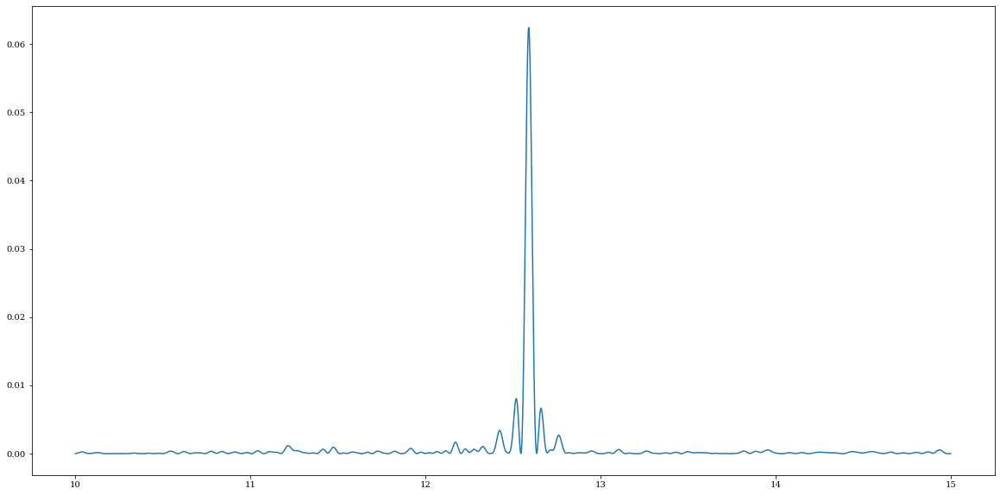

flagged 10
all 12893


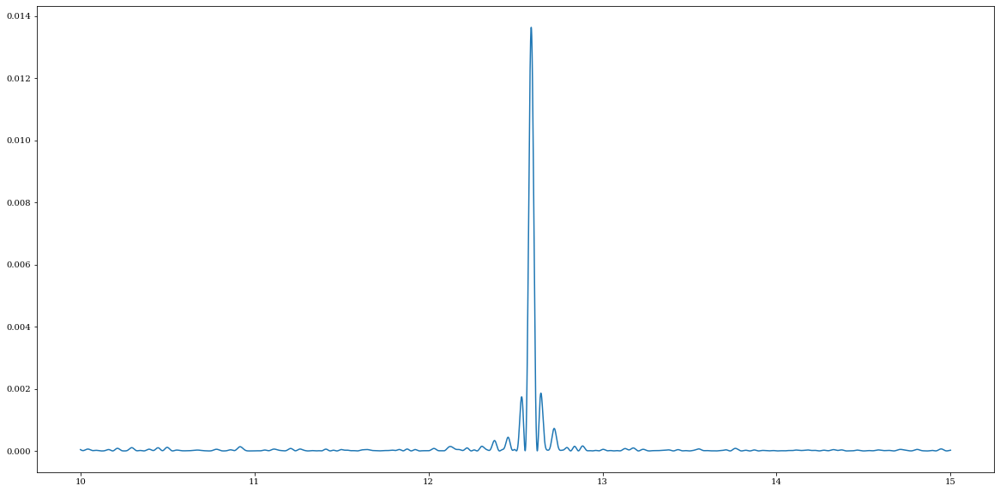

flagged 2486
all 99709


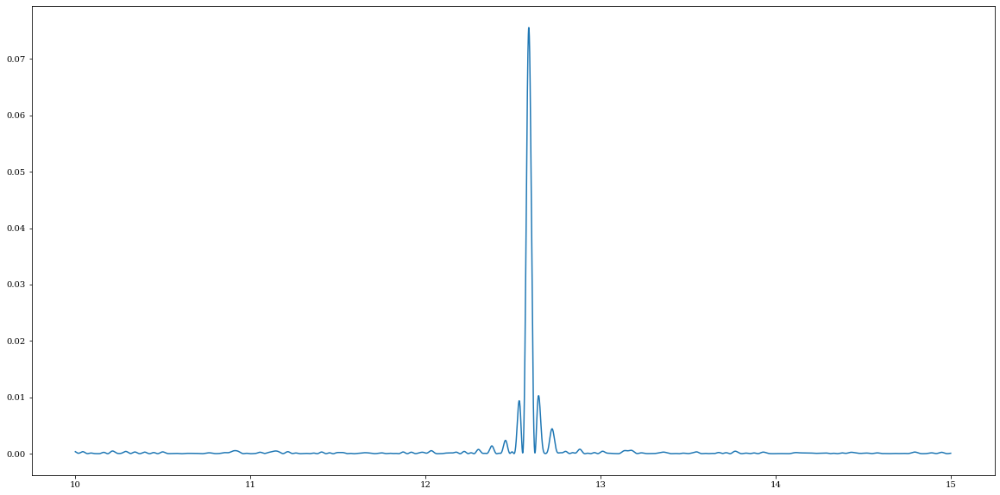

flagged 1
all 16594


In [15]:
IList = [0,1,2]
for i in IList:
    sec30 = search_result[i].download()
    sec3 = sec30.PDCSAP_FLUX.remove_nans()
    flux = sec3.flux
    time = sec3.time
    fig = plt.figure(figsize=(20,10))
    freq = np.linspace(10, 15, 10000)
    power = LombScargle(time, flux).power(freq)
    plt.plot(freq,power)
    plt.show()
    print('flagged', len(sec3.quality[sec3.quality > 0]))
    print('all', len(sec3.flux))

#powerTess = power


In [9]:
for el in sec3.quality:
    if el != 0:
        print(el)

512


In [11]:
lk.TessQualityFlags.decode(512)

['Impulsive outlier']

In [2]:
search_result = lk.search_lightcurvefile('WD 1658+440')
search_result

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: LightkurveDeprecationWarning: The search_lightcurvefile function is deprecated and may be removed in a future version.
        Use search_lightcurve() instead.
  """Entry point for launching an IPython kernel.


#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 24,2020,SPOC,120,115613388,0.0
1,TESS Sector 24,2020,TESS-SPOC,1800,115613388,0.0
2,TESS Sector 25,2020,SPOC,120,115613388,0.0
3,TESS Sector 25,2020,TESS-SPOC,1800,115613388,0.0
4,TESS Sector 26,2020,SPOC,120,115613388,0.0
5,TESS Sector 26,2020,TESS-SPOC,1800,115613388,0.0
6,TESS Sector 51,2022,SPOC,20,115613388,0.0
7,TESS Sector 51,2022,SPOC,120,115613388,0.0


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  


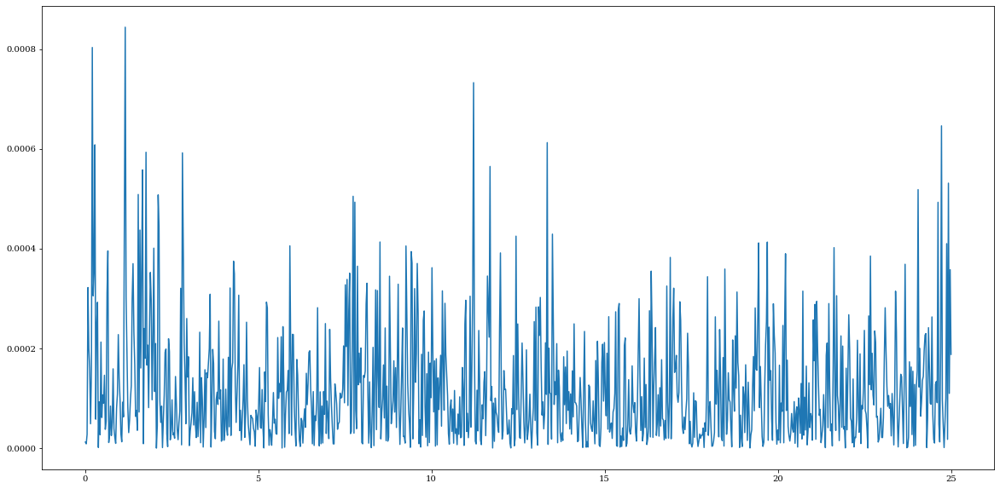

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  


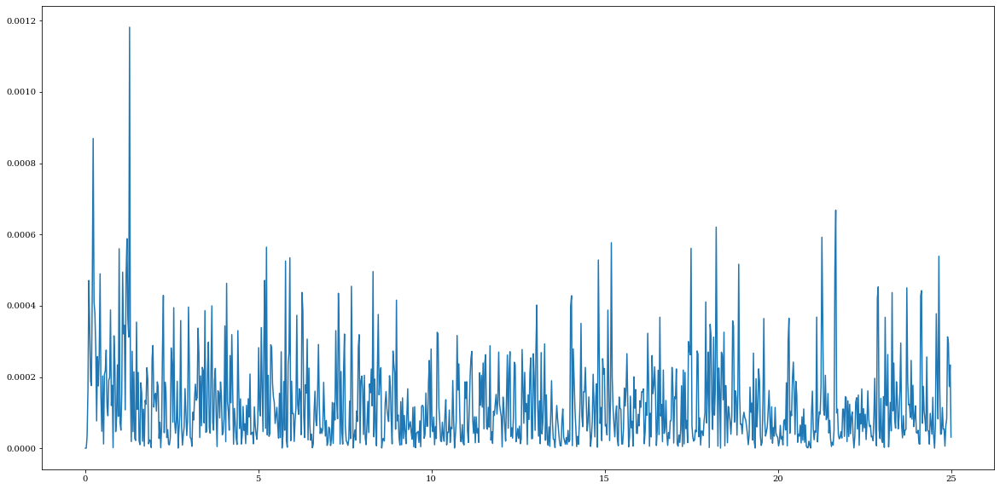

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  


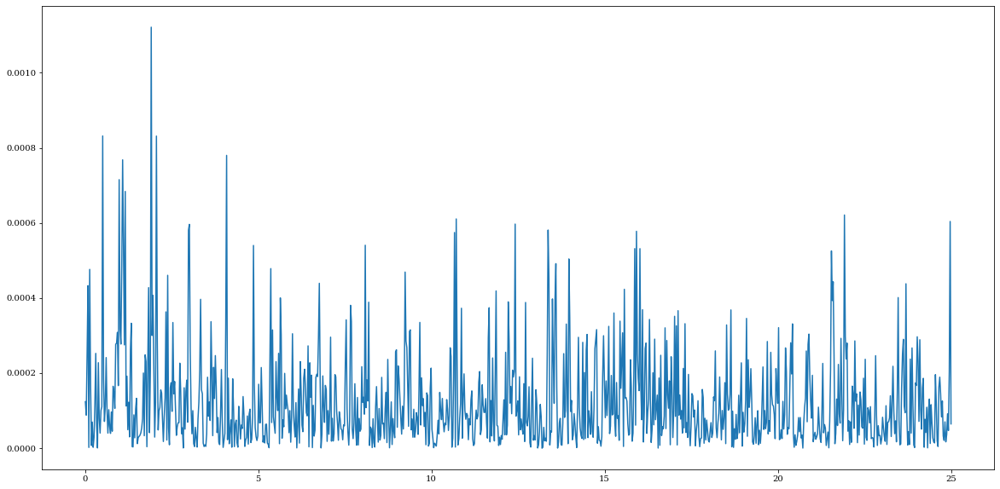

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  


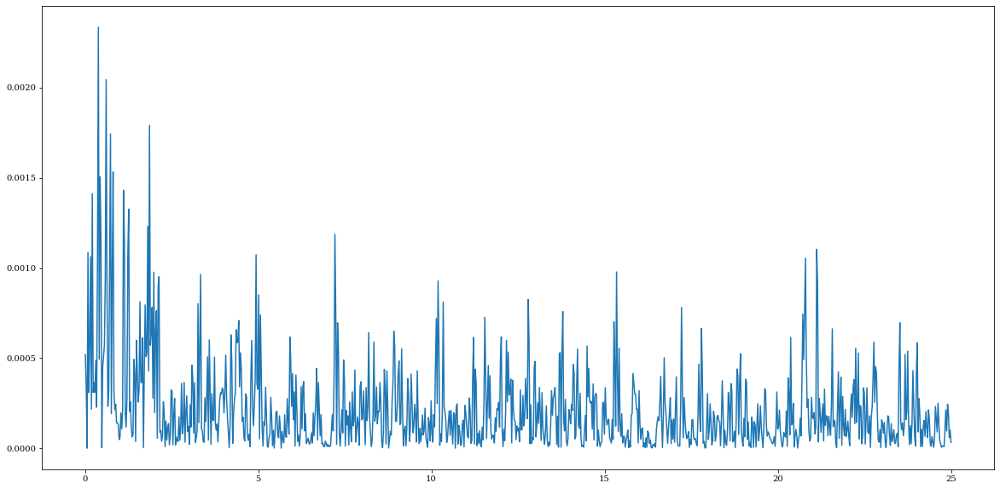

In [4]:
IList = [0,2,4,7]
times = []
fluxes = []
for i in IList:
        sec30 = search_result[i].download()
        sec3 = sec30.PDCSAP_FLUX.remove_nans()
        flux = sec3.flux
        time = sec3.time.value
        times.append(time)
        fluxes.append(flux)
        plt.figure(figsize=(20,10))
        freq = np.linspace(0.01, 25, 1000)
        power = LombScargle(time, flux).power(freq)
        #plt.plot([14.1176470588,14.1176470588],[0,max(power)])
        plt.plot(freq,power)

        plt.show()

#powerTess = power


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  
/home/nwal/anaconda3/lib/python3.7/site-packages/lightkurve/collections.py:164: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  return LightCurveCollection([lc.PDCSAP_FLUX for lc in self])
/home/nwal/anaconda3/lib/python3.7/site-packages/lightkurve/collections.py:164: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  return LightCurveCollection([lc.PDCSAP_FLUX for lc in self])
/home/nwal/anaconda3/lib/python3.7/site-packages/lightkurve/collections.py:164: LightkurveDeprecationWarning: The PDCSAP_FLUX function is deprecated and may be removed in a future version.
  return LightCurveCollection([lc.PDCSAP_FLUX for lc in self])
/home/nwal/anaconda3/lib/python3.7/site-packages/lightkurv

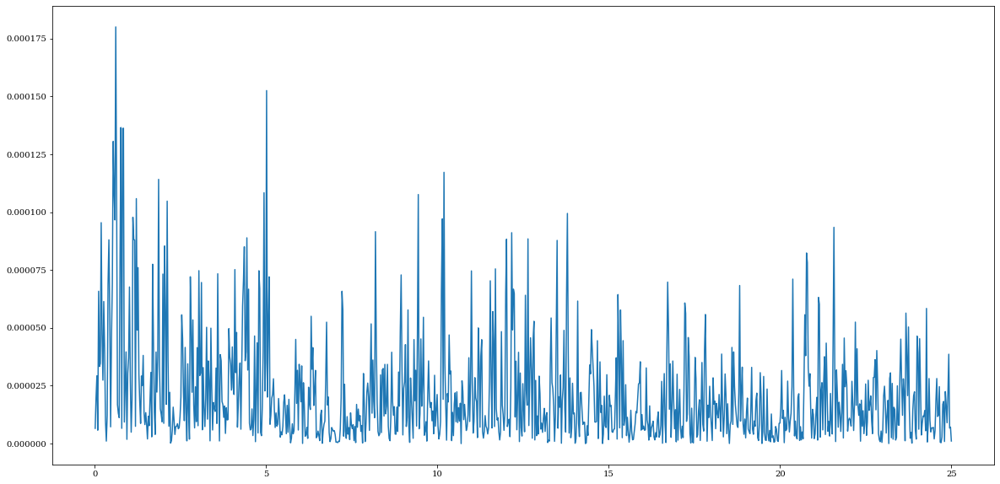

In [7]:
collection = search_result.download_all()
data = collection.PDCSAP_FLUX.stitch()
data = data.remove_nans()
fluxes = data.flux.value
times = data.time.value
plt.figure(figsize=(20,10))
freq = np.linspace(0.01, 25, 1000)
power = LombScargle(times, fluxes).power(freq)
plt.plot(freq,power)

In [8]:
print(1/freq[np.argmax(power)])

1.6383763837638377


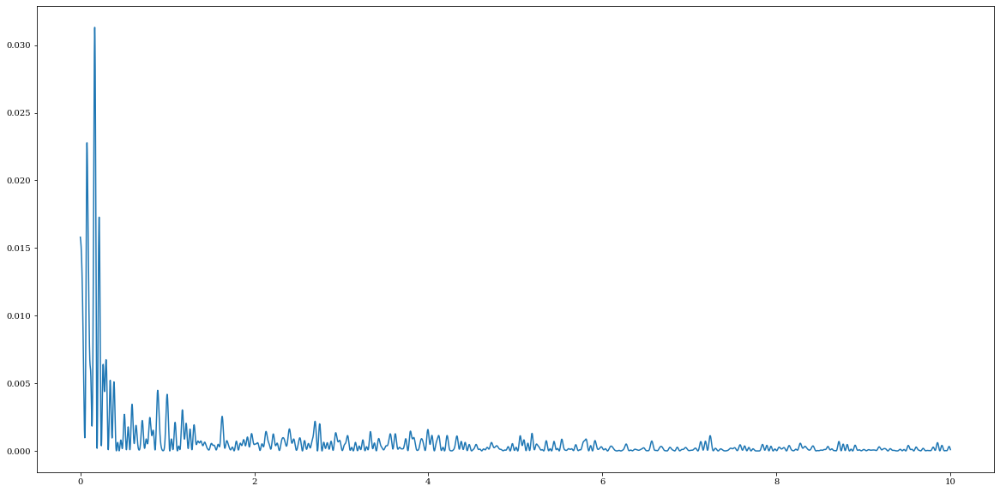

In [18]:
sec3 = sec30.PDCSAP_FLUX.remove_nans()
flux = sec3.flux
time = sec3.time
plt.figure(figsize=(20,10))
freq = np.linspace(0.001, 10, 10000)
power = LombScargle(time, flux).power(freq)
plt.plot(freq,power)

#powerTess = power


RE J0317-853


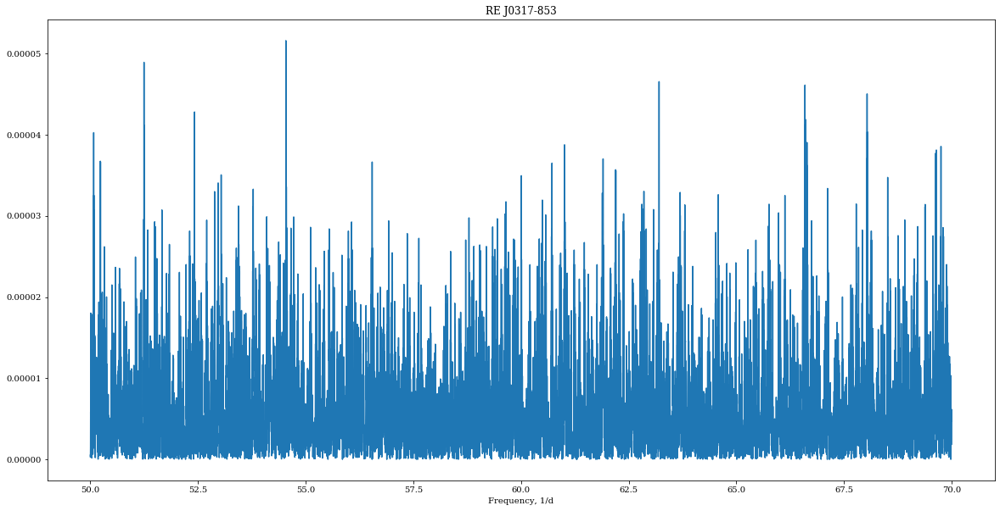

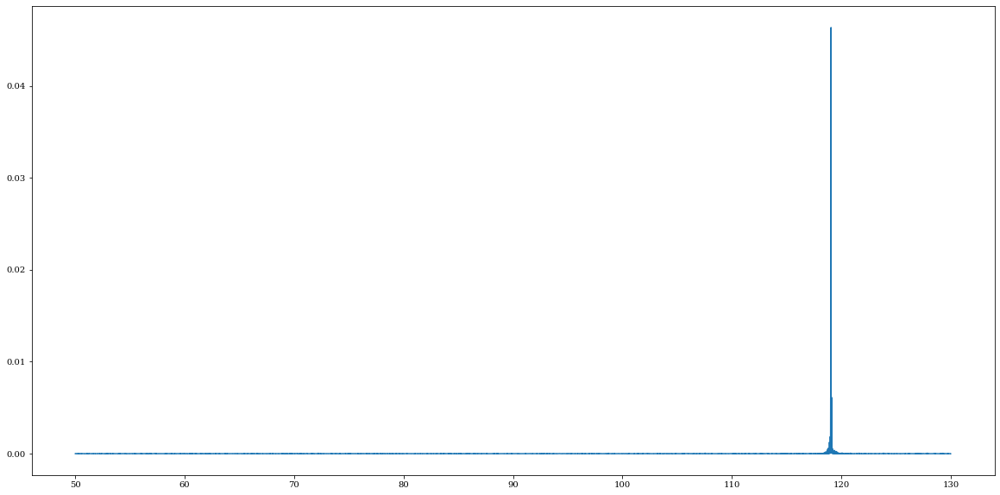

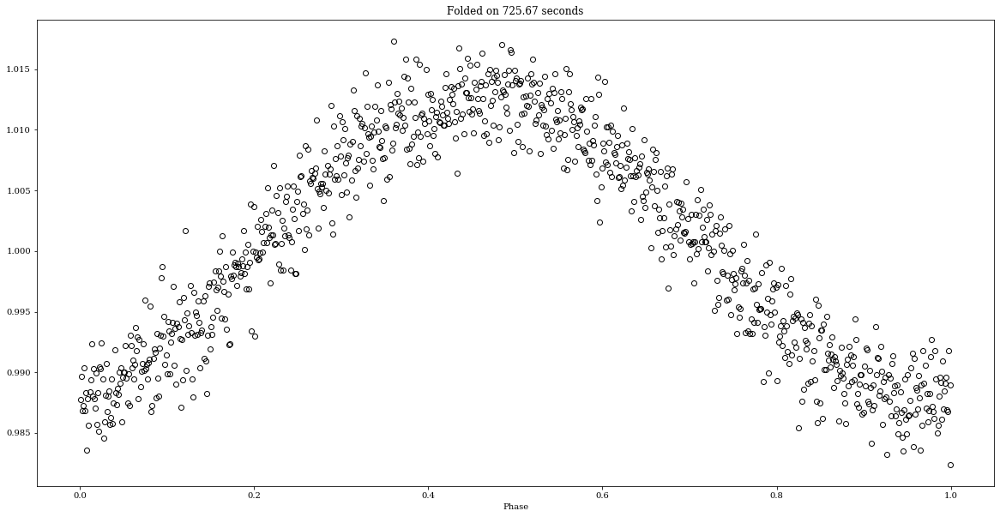

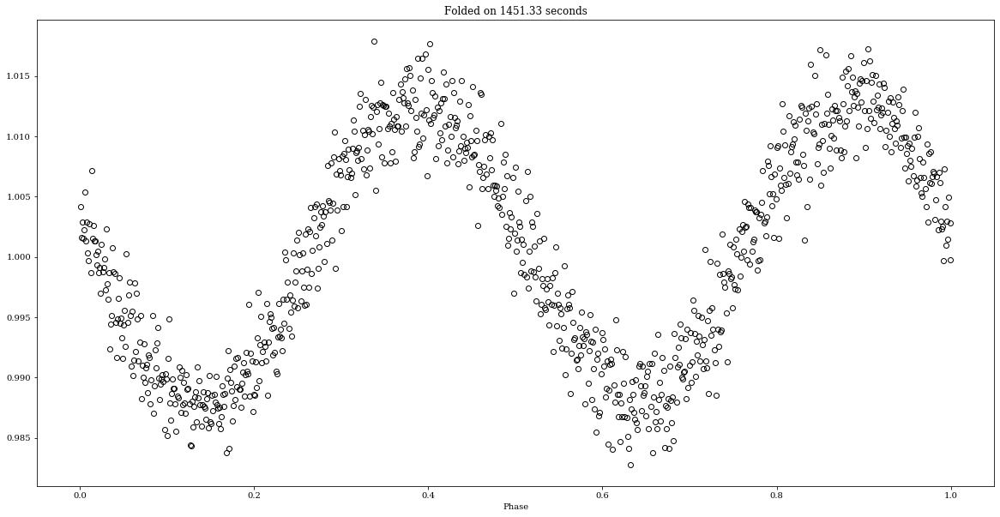

In [20]:
lcExist = ['RE J0317-853']


with PdfPages('RE J0317-853F.pdf') as pdf:
    for el in lcExist:
        print(el)
        search_result = lk.search_lightcurvefile(el)
        if len(search_result)>1:
                collection = search_result.download_all()
                data = collection.PDCSAP_FLUX.stitch()
                data = data.remove_nans()
        else:
                data = search_result[0].download()
                data = data.PDCSAP_FLUX.remove_nans()
        flux = data.flux
        time = data.time
        freq = np.linspace(50, 70, 10000)
        power = LombScargle(time, flux).power(freq)
        fig = plt.figure(figsize=(20,10))
        plt.plot(freq,power)
        plt.xlabel('Frequency, 1/d')
        plt.title(el)
        pdf.savefig(fig)
        #plt.show()
        freq = np.linspace(50, 130, 10000)
        power = LombScargle(time, flux).power(freq)
        bestPeriod = 1/freq[np.argmax(power)]
        fig = plt.figure(figsize=(20,10))
        plt.plot(freq,power)
        pdf.savefig(fig)
        #plt.show()
        fig = plt.figure(figsize=(20,10))
        phases = foldMeth(time, bestPeriod)
        
        sortIndi = np.argsort(phases)
        phases = phases[sortIndi]
        flux = flux[sortIndi]
        flux = np.nanmean(np.pad(flux.astype(float), (0, 200 - flux.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
        phases = np.nanmean(np.pad(phases.astype(float), (0, 200 - phases.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
        plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
        plt.title('Folded on '+ str(np.round(bestPeriod*24*60*60,decimals=2)) +' seconds')
        plt.xlabel('Phase')
        pdf.savefig(fig)
        
        
        
        
        fig = plt.figure(figsize=(20,10))
        flux = data.flux
        time = data.time+5
        phases = foldMeth(time, 2*bestPeriod)
        
        sortIndi = np.argsort(phases)
        phases = phases[sortIndi]
        flux = flux[sortIndi]
        flux = np.nanmean(np.pad(flux.astype(float), (0, 200 - flux.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
        phases = np.nanmean(np.pad(phases.astype(float), (0, 200 - phases.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
        plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
        plt.title('Folded on '+ str(np.round(bestPeriod*2*24*60*60,decimals=2)) +' seconds')
        plt.xlabel('Phase')
        pdf.savefig(fig)
        #plt.show()
        print('==============================================')
        print('==============================================')
        print('==============================================')
        print('==============================================')
        print('==============================================')

WD0137-349


LB 5959
SDSS J120515.80-024222.6


SDSSJ123127.14+004132.9


EPIC212235321


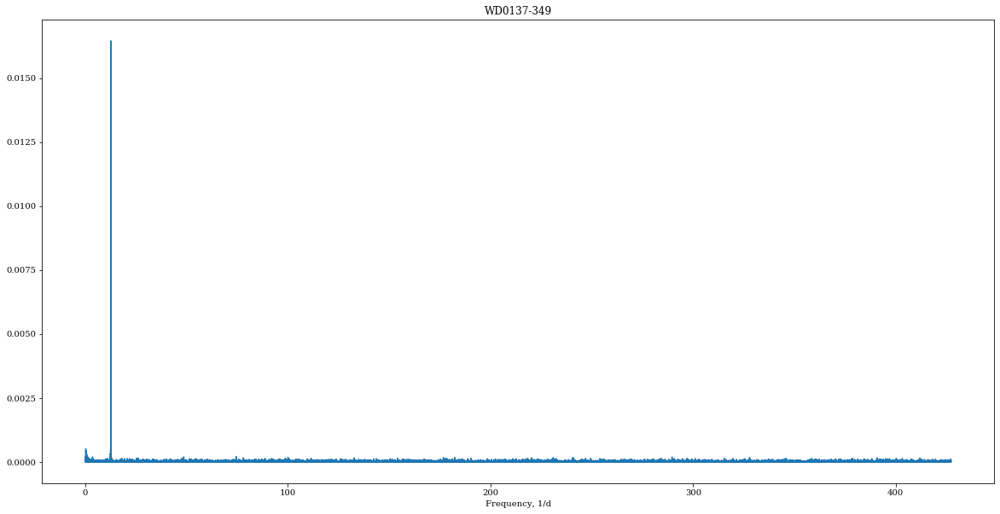

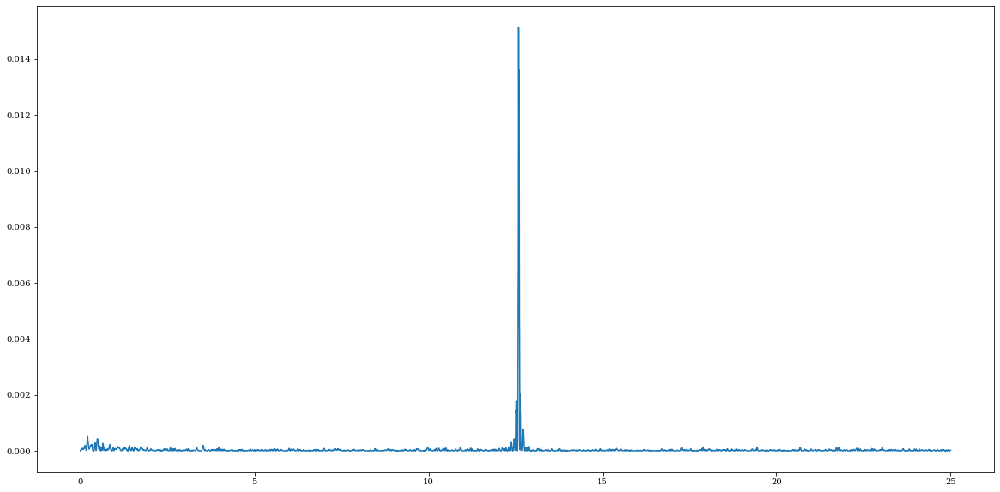

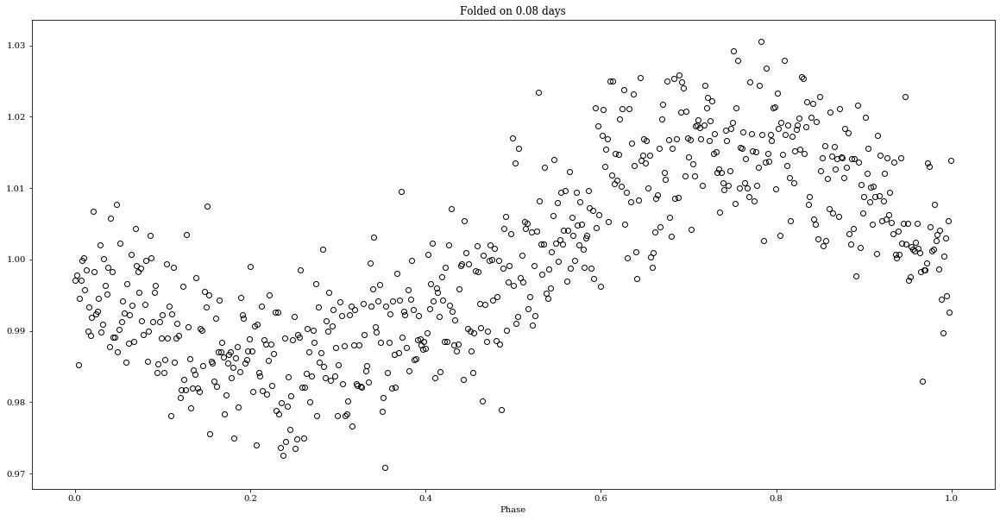

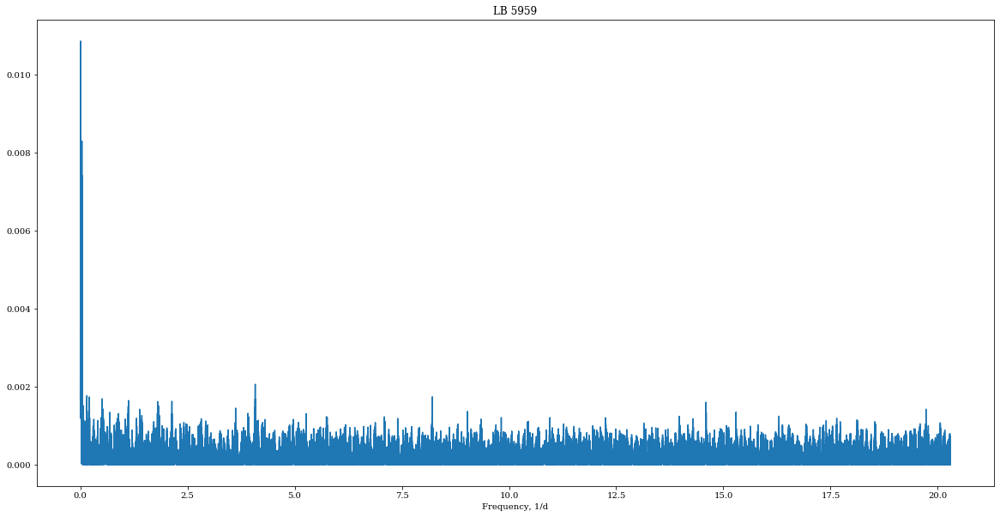

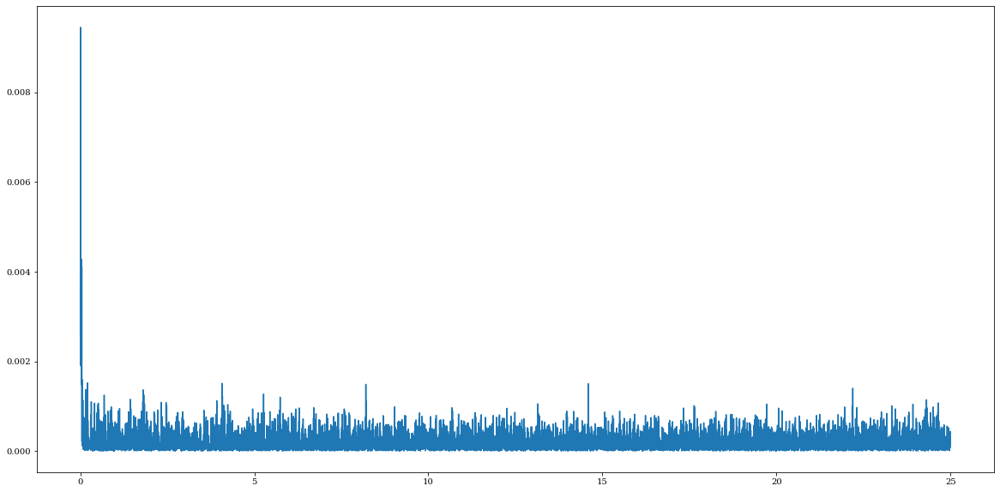

...

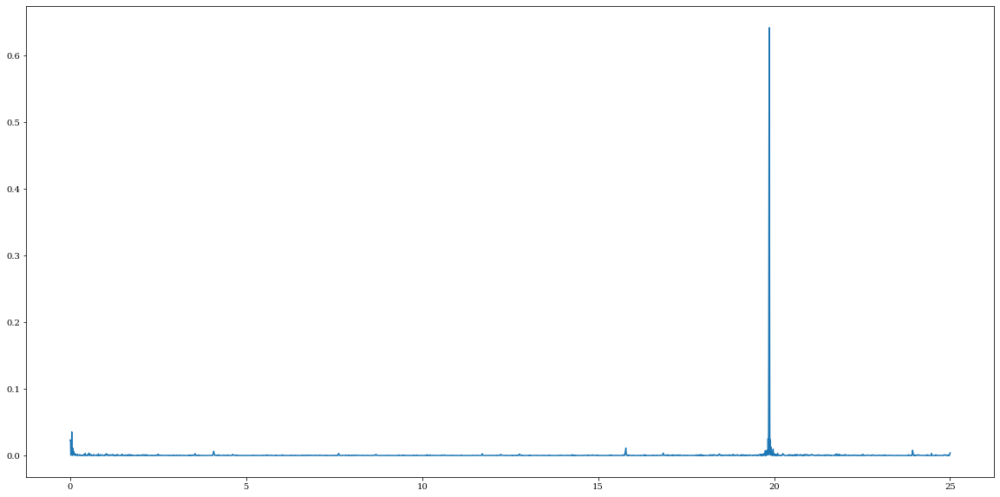

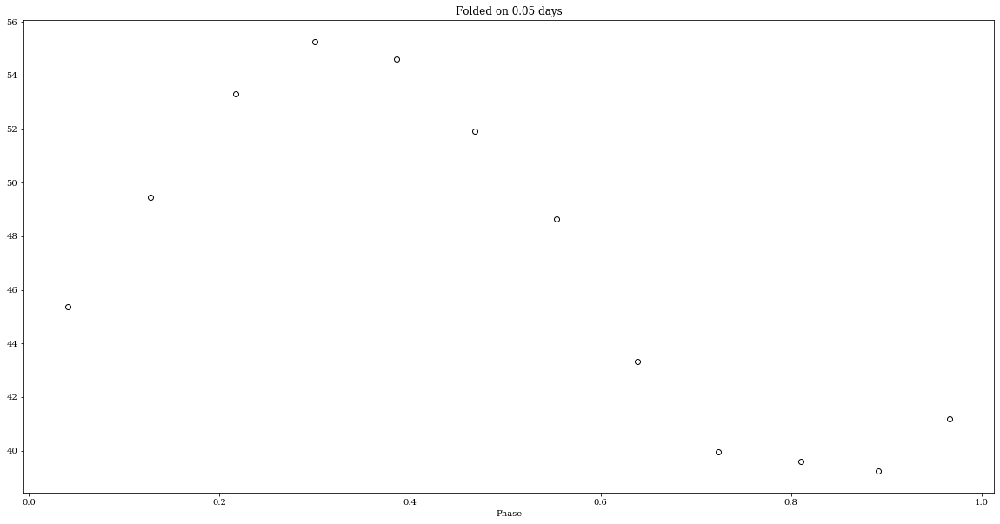

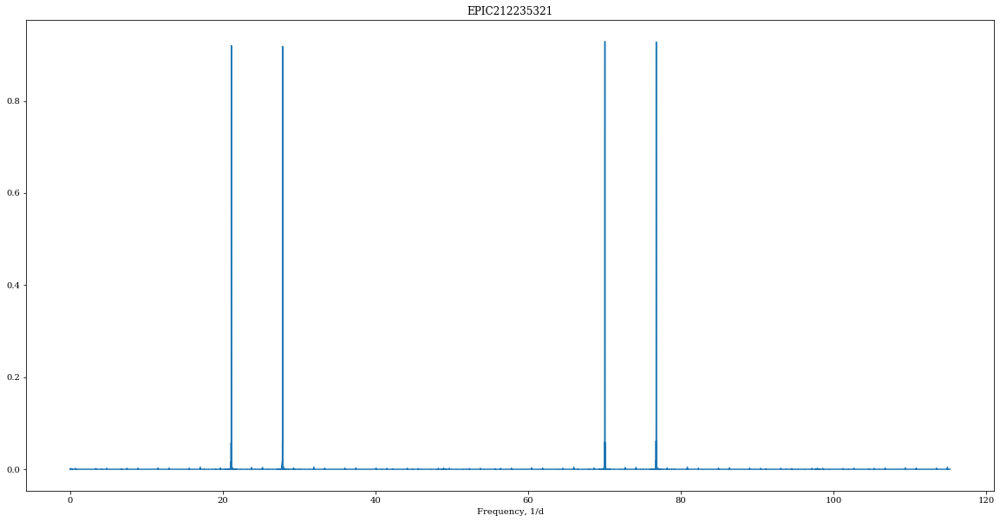

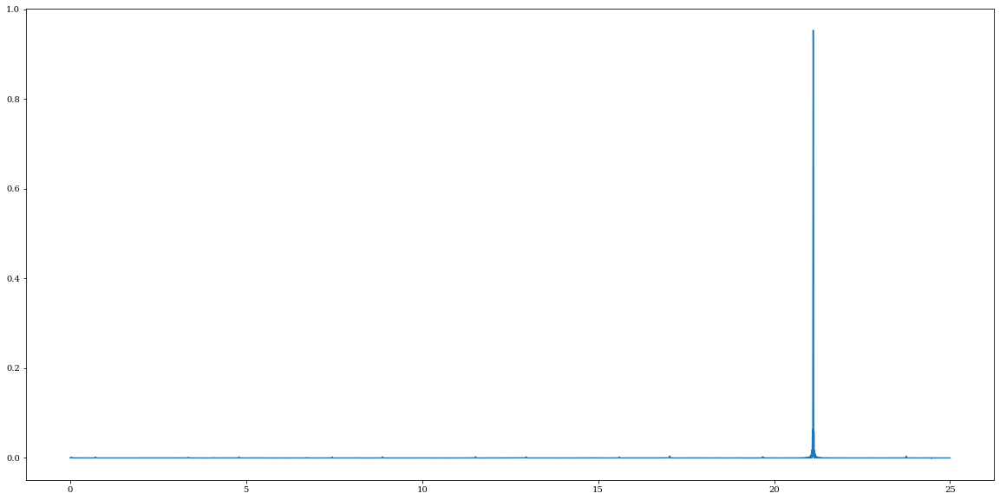

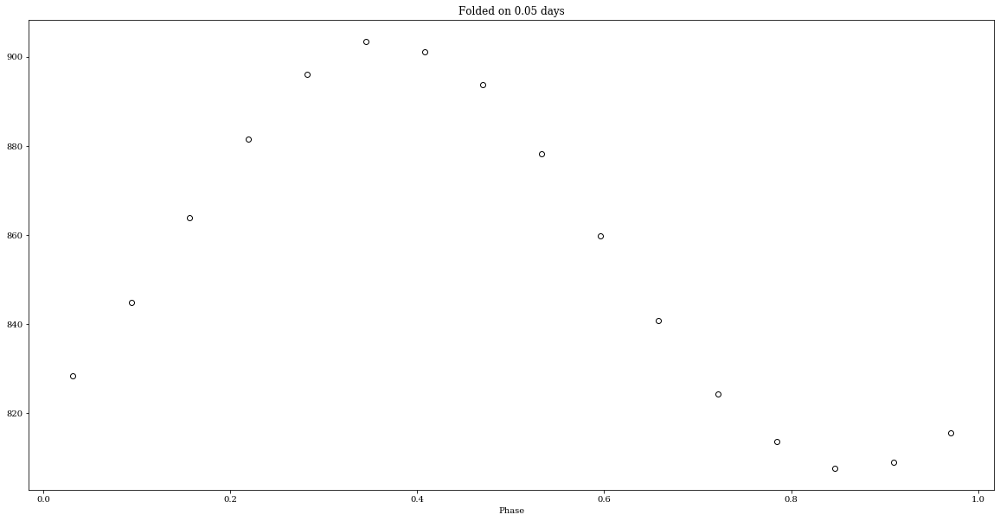

In [13]:
lcExist = ['WD0137-349', 'LB 5959', 'SDSS J120515.80-024222.6', 'SDSSJ123127.14+004132.9', 'EPIC212235321']
from matplotlib.backends.backend_pdf import PdfPages

with PdfPages('testMWD.pdf') as pdf:
    for el in lcExist:
        print(el)
        search_result = lk.search_lightcurvefile(el)
        if len(search_result)>1:
                collection = search_result.download_all()
                data = collection.PDCSAP_FLUX.stitch()
                data = data.remove_nans()
        else:
                data = search_result[0].download()
                data = data.PDCSAP_FLUX.remove_nans()
        flux = data.flux
        time = data.time
        frequency, power = LombScargle(time, flux).autopower()
        fig = plt.figure(figsize=(20,10))
        plt.plot(frequency,power)
        plt.xlabel('Frequency, 1/d')
        plt.title(el)
        pdf.savefig(fig)
        #plt.show()
        freq = np.linspace(0.001, 25, 10000)
        power = LombScargle(time, flux).power(freq)
        bestPeriod = 1/freq[np.argmax(power)]
        fig = plt.figure(figsize=(20,10))
        plt.plot(freq,power)
        pdf.savefig(fig)
        #plt.show()
        fig = plt.figure(figsize=(20,10))
        phases = foldMeth(time, bestPeriod)
        
        sortIndi = np.argsort(phases)
        phases = phases[sortIndi]
        flux = flux[sortIndi]
        flux = np.nanmean(np.pad(flux.astype(float), (0, 200 - flux.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
        phases = np.nanmean(np.pad(phases.astype(float), (0, 200 - phases.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
        plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
        plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
        plt.xlabel('Phase')
        pdf.savefig(fig)
        #plt.show()
        print('==============================================')
        print('==============================================')
        print('==============================================')
        print('==============================================')
        print('==============================================')

WD 2359−434
WD 0009+501
WD 0011−721
WD 0011−134
WD 0121−429


WD 0233−242
WD 0322−019


D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 0503−174


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 0548−001


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 0708−670


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 0810−353


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 0816−310


D:\conda\lib\site-packages\lightkurve\lightcurve.py:667: LightkurveWarning: The light curve has a negative median flux (-1.29e+01); `normalize()` will therefore divide by a negative number and invert the light curve, which is probablynot what you want
  LightkurveWarning)
D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 f

WD 0912+536


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 1008+290


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 1009−184


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 1036−204


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 1309+853


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 1315−781


D:\conda\lib\site-packages\lightkurve\lightcurve.py:667: LightkurveWarning: The light curve has a negative median flux (-1.49e+01); `normalize()` will therefore divide by a negative number and invert the light curve, which is probablynot what you want
  LightkurveWarning)
D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 f

WD 1350−090


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 1748+708


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 1829+547


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 1900+705


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 2047+372


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


WD 2153−512


D:\conda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
D:\conda\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


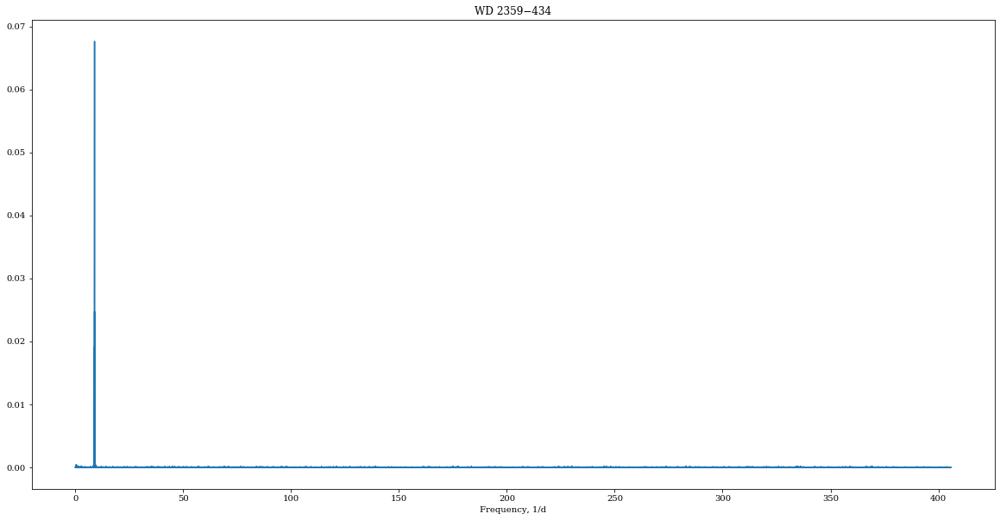

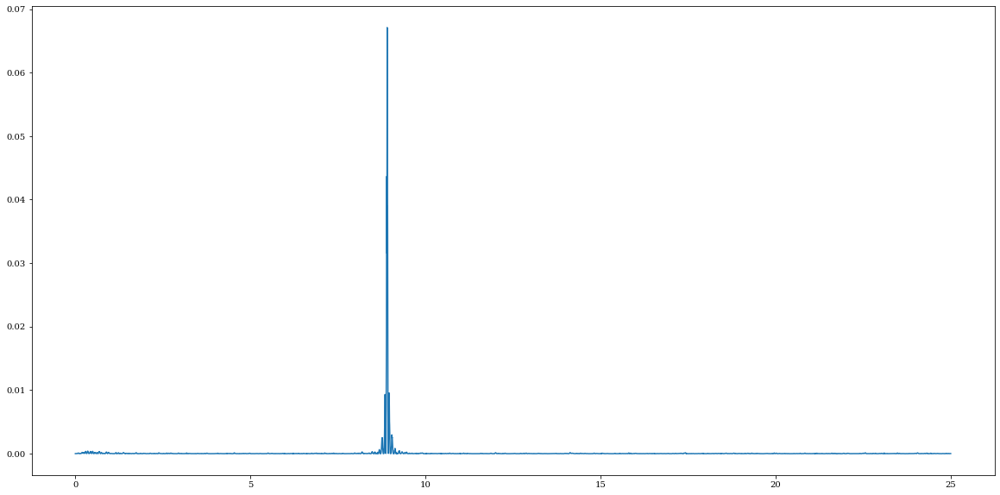

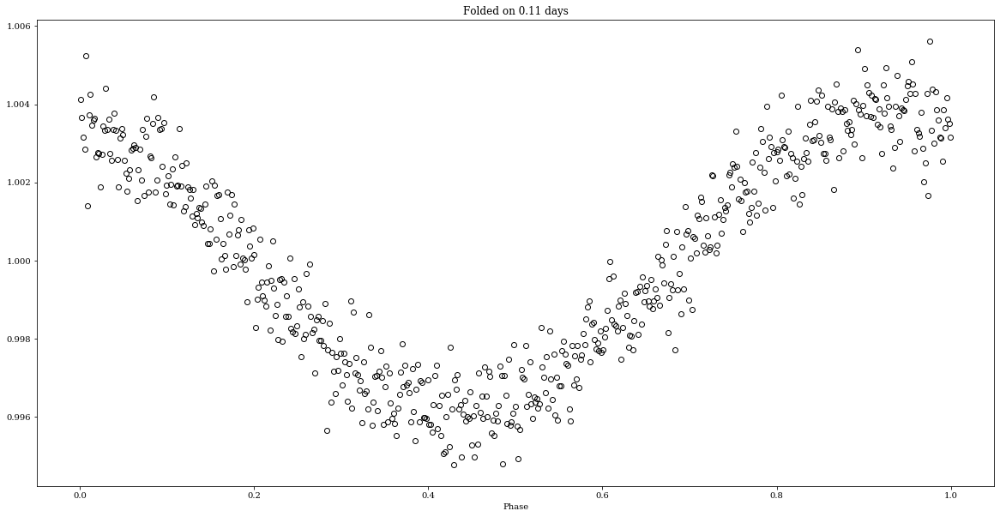

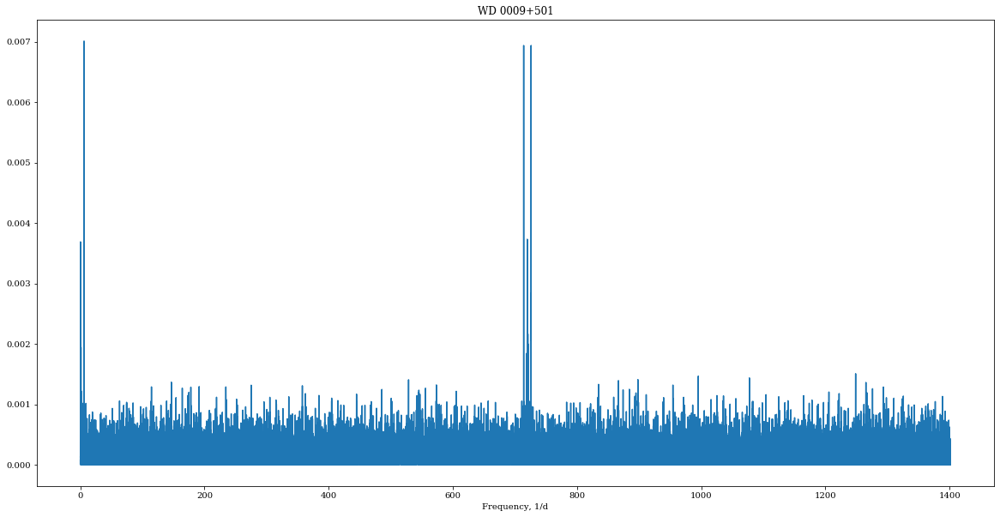

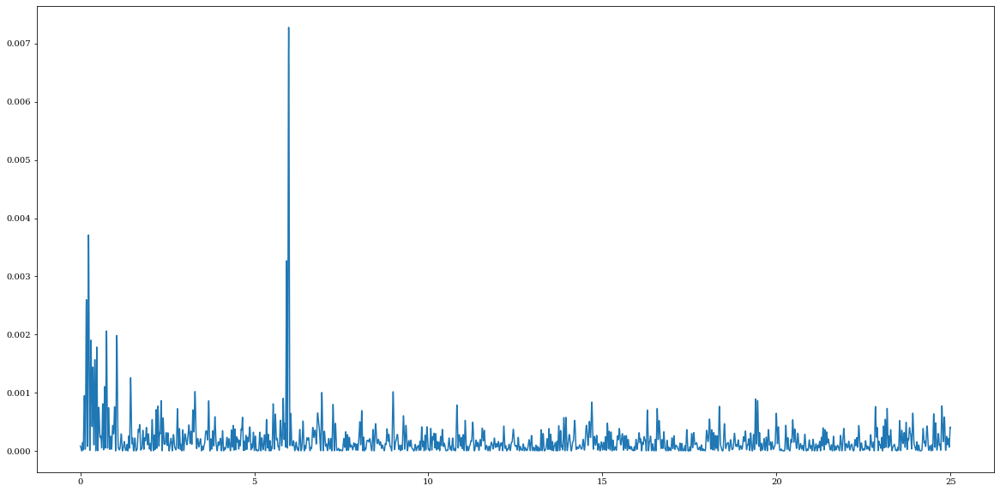

...

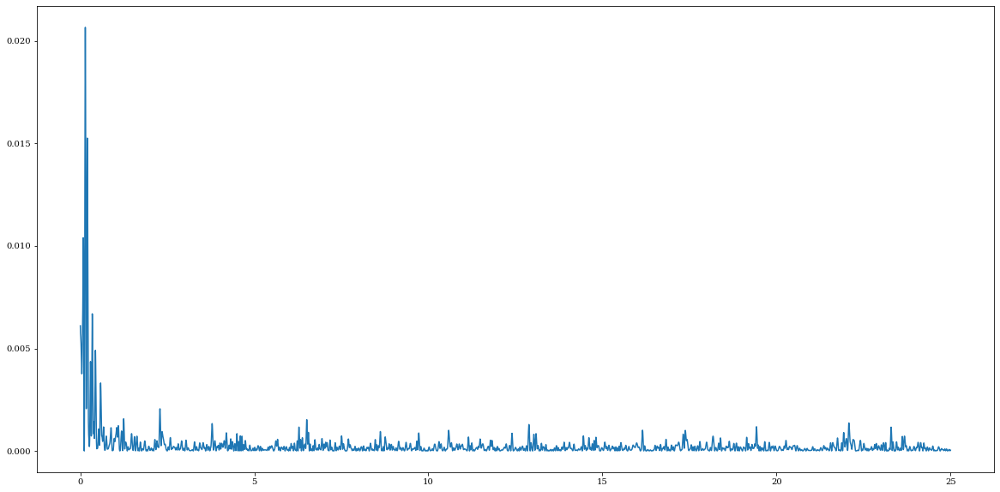

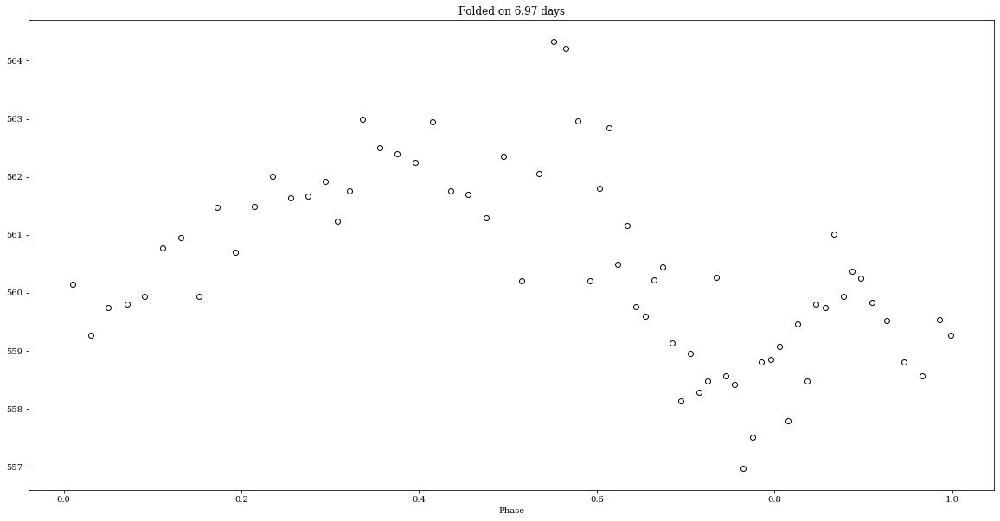

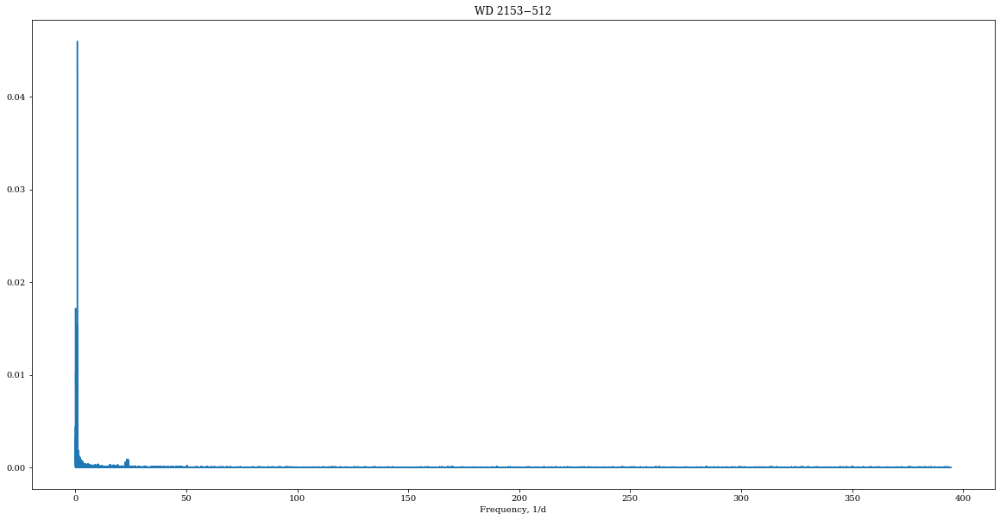

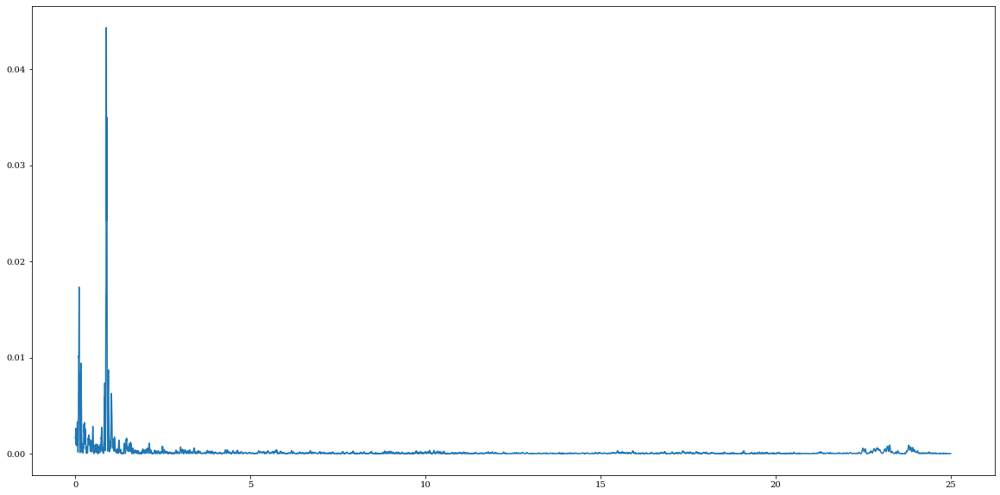

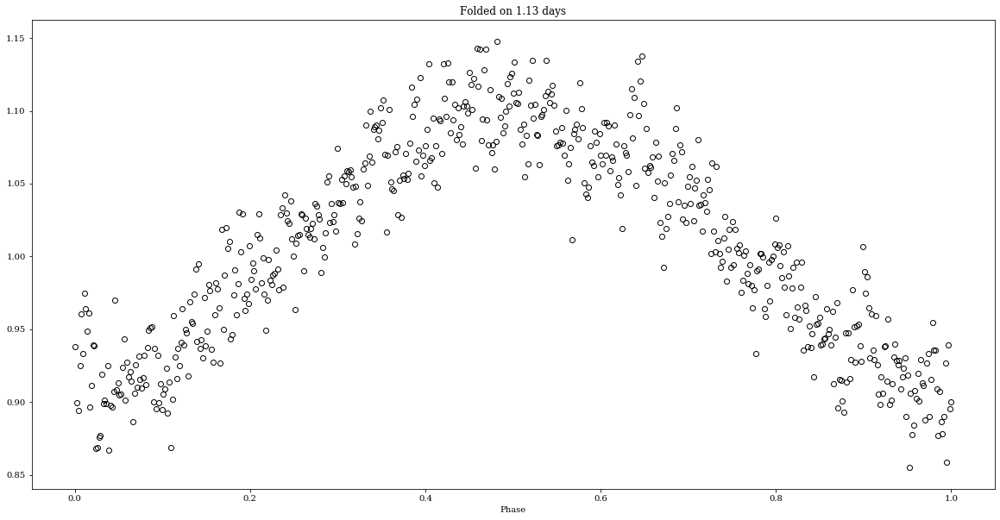

In [45]:
lcExist = ['WD 2359−434', 'WD 0009+501', 'WD 0011−721', 'WD 0011−134', 'WD 0121−429', 'WD 0233−242', 'WD 0322−019', 'WD 0503−174', 'WD 0548−001', 'WD 0708−670', 'WD 0810−353', 'WD 0816−310', 'WD 0912+536', 'WD 1008+290', 'WD 1009−184', 'WD 1036−204', 'WD 1309+853', 'WD 1315−781', 'WD 1350−090', 'WD 1748+708', 'WD 1829+547', 'WD 1900+705', 'WD 2047+372', 'WD 2153−512']
from matplotlib.backends.backend_pdf import PdfPages

with PdfPages('testMWD.pdf') as pdf:
    for el in lcExist:
        print(el)
        search_result = lk.search_lightcurvefile(el)
        if len(search_result)>1:
                collection = search_result.download_all()
                data = collection.PDCSAP_FLUX.stitch()
                data = data.remove_nans()
        else:
                data = search_result[0].download()
                data = data.PDCSAP_FLUX.remove_nans()
        flux = data.flux
        time = data.time
        frequency, power = LombScargle(time, flux).autopower()
        fig = plt.figure(figsize=(20,10))
        plt.plot(frequency,power)
        plt.xlabel('Frequency, 1/d')
        plt.title(el)
        pdf.savefig(fig)
        #plt.show()
        freq = np.linspace(0.001, 25, 10000)
        power = LombScargle(time, flux).power(freq)
        bestPeriod = 1/freq[np.argmax(power)]
        fig = plt.figure(figsize=(20,10))
        plt.plot(freq,power)
        pdf.savefig(fig)
        #plt.show()
        fig = plt.figure(figsize=(20,10))
        phases = foldMeth(time, bestPeriod)
        
        sortIndi = np.argsort(phases)
        phases = phases[sortIndi]
        flux = flux[sortIndi]
        flux = np.nanmean(np.pad(flux.astype(float), (0, 200 - flux.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
        phases = np.nanmean(np.pad(phases.astype(float), (0, 200 - phases.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
        plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
        plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
        plt.xlabel('Phase')
        pdf.savefig(fig)
        #plt.show()
        print('==============================================')
        print('==============================================')
        print('==============================================')
        print('==============================================')
        print('==============================================')

In [8]:
search_result = lk.search_lightcurvefile('WD 1350-090',cadence='fast')
search_result

#,observation,target_name,productFilename,distance
0,K2 Campaign 6,ktwo212657308,ktwo212657308-c06_llc.fits,0.0
1,K2 Campaign 17,ktwo212657308,ktwo212657308-c17_llc.fits,0.0


0
0


Text(0.5, 0, 'Phase')

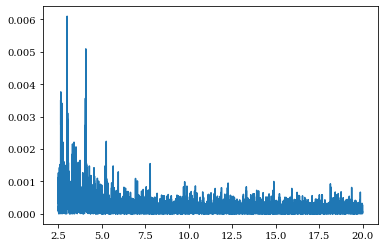

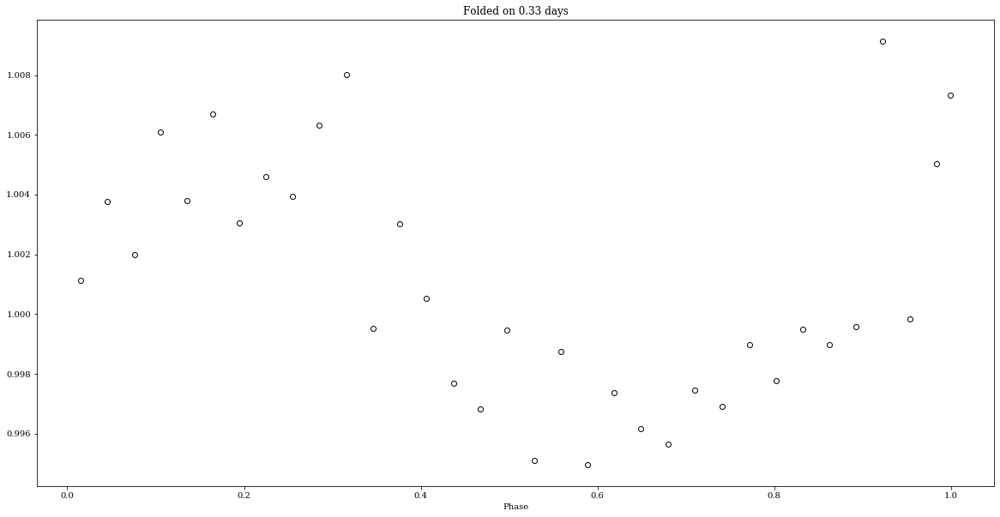

In [11]:
collection = search_result.download_all()
data = collection.PDCSAP_FLUX.stitch()
data = data.remove_nans()
flux = data.flux
time = data.time
freq = np.linspace(2.5, 20, 10000)
power = LombScargle(time, flux).power(freq)
plt.plot(freq,power)
print(np.isnan(time).sum())
print(np.isnan(flux).sum())

powerTess = power

bestPeriod = 1/freq[np.argmax(power)]
bestPeriod


plt.figure(figsize=(20,10))
phases = foldMeth(time, bestPeriod)
        
sortIndi = np.argsort(phases)
phases = phases[sortIndi]
flux = flux[sortIndi]
flux = np.nanmean(np.pad(flux.astype(float), (0, 200 - flux.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
phases = np.nanmean(np.pad(phases.astype(float), (0, 200 - phases.size%200), mode='constant', constant_values=np.NaN).reshape(-1, 200), axis=1)
plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
plt.xlabel('Phase')

In [84]:
search_result = lk.search_tesscut('WD 0004+122')
search_result
#tpf = search_result.download(cutout_size=30)
#target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
#n_target_pixels = target_mask.sum()
#tpf.plot(aperture_mask=target_mask, mask_color='k')

No data found for target "WD 0004+122".


SearchResult containing 0 data products.

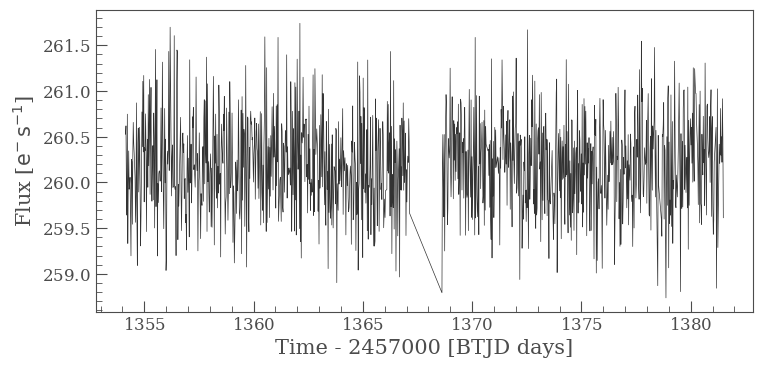

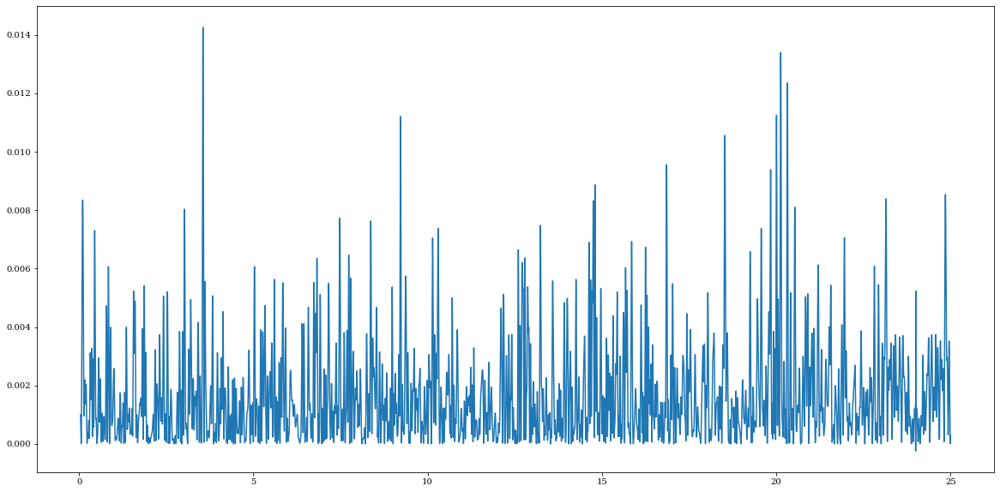

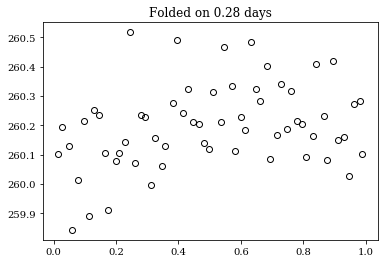

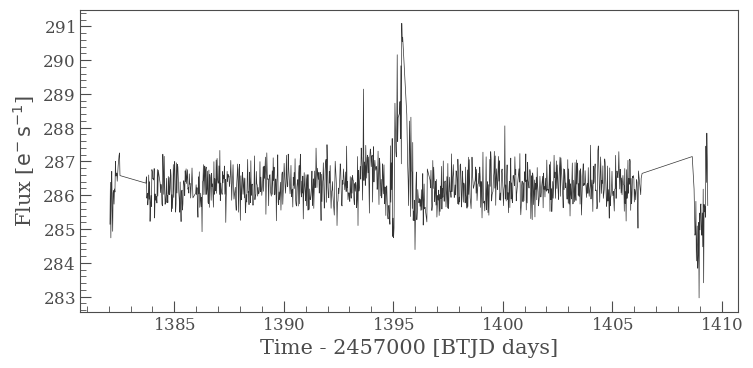

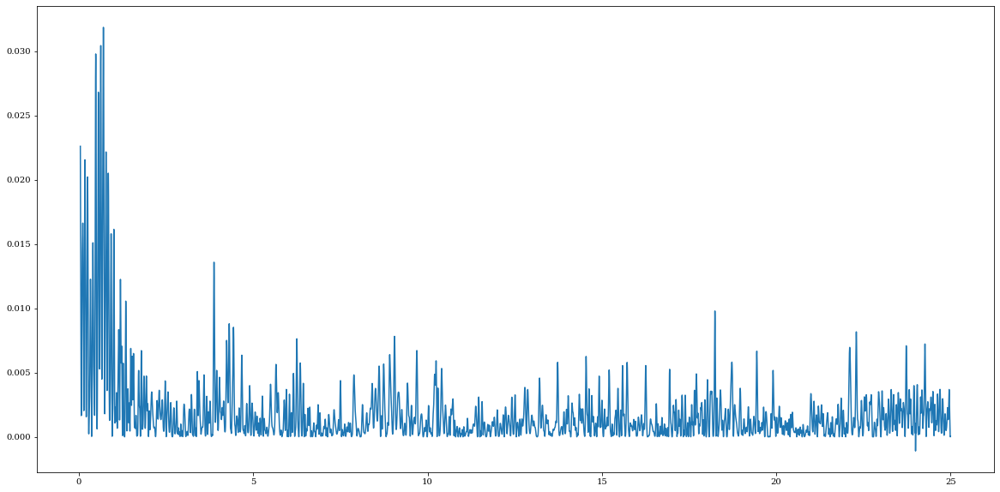

...

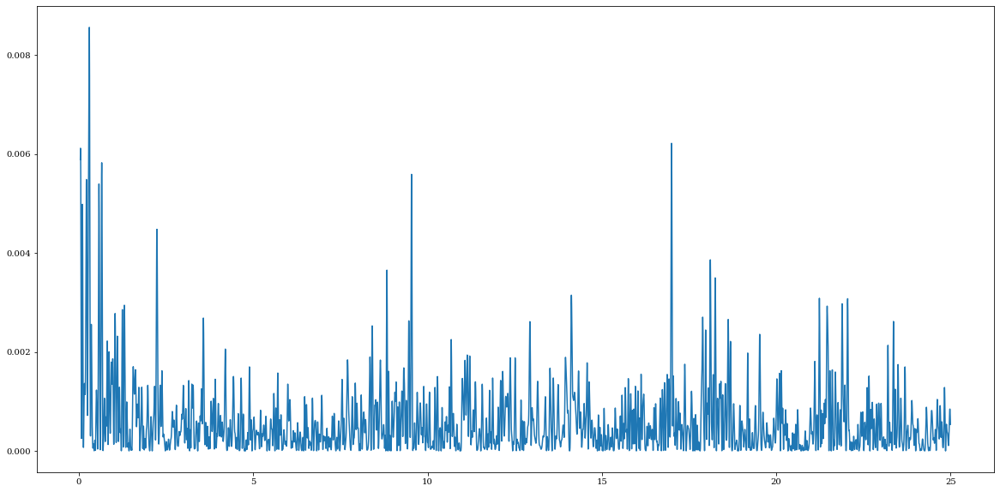

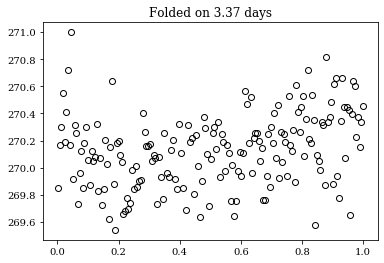

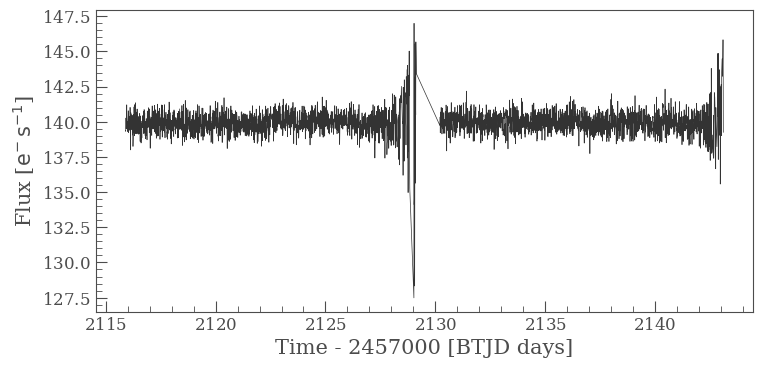

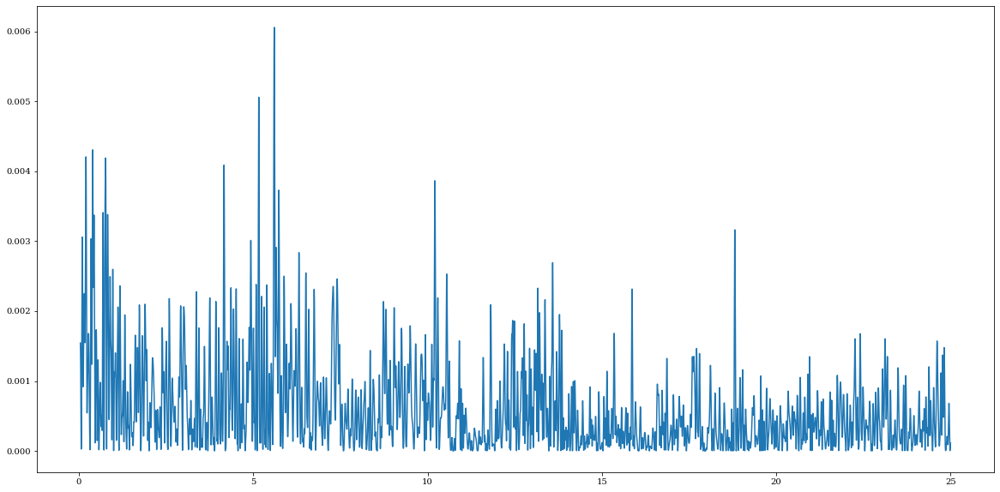

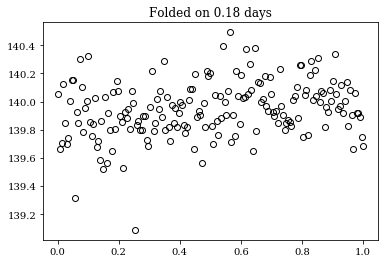

In [126]:
search_result = lk.search_tesscut('WD 0121−429')
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

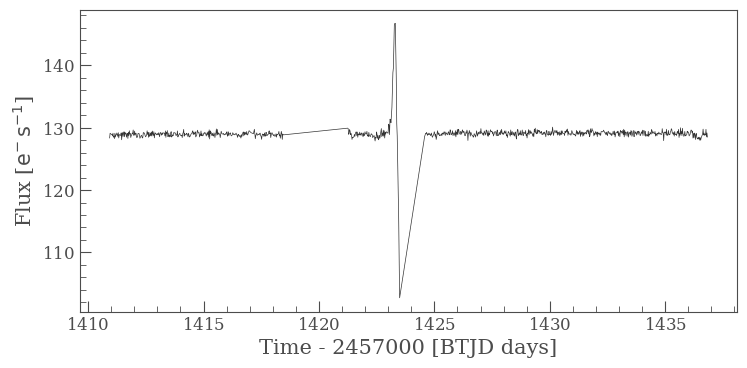

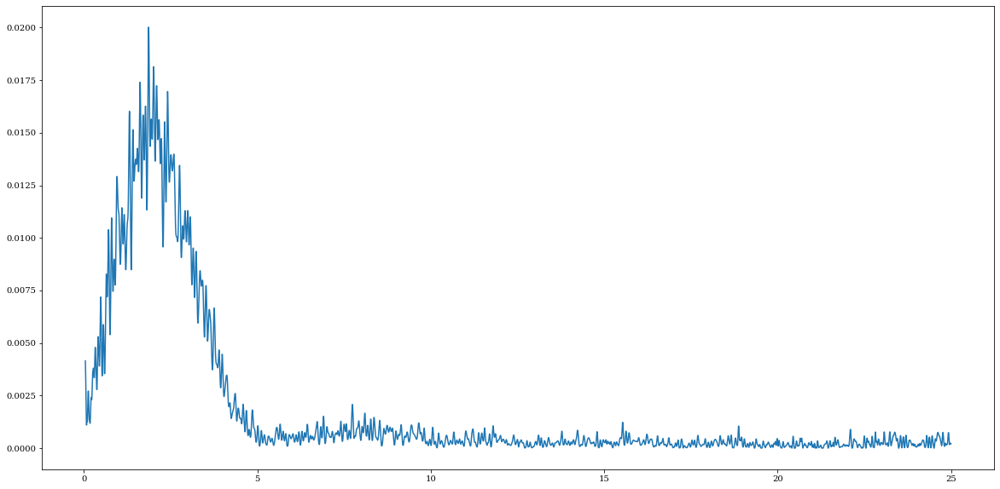

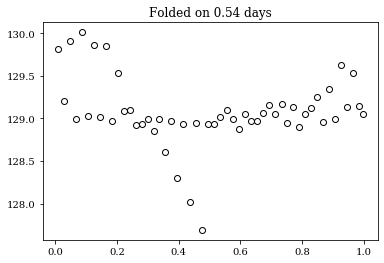

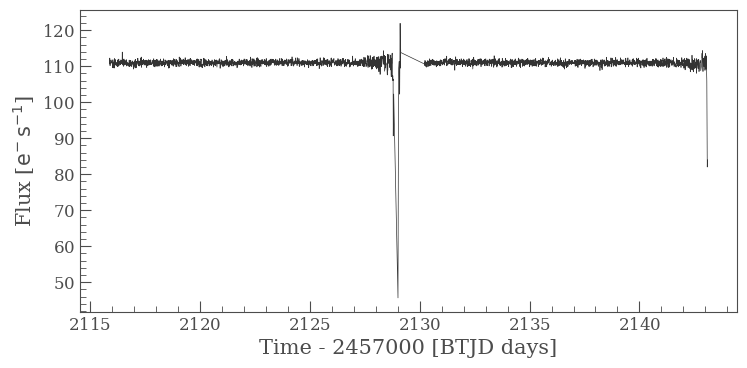

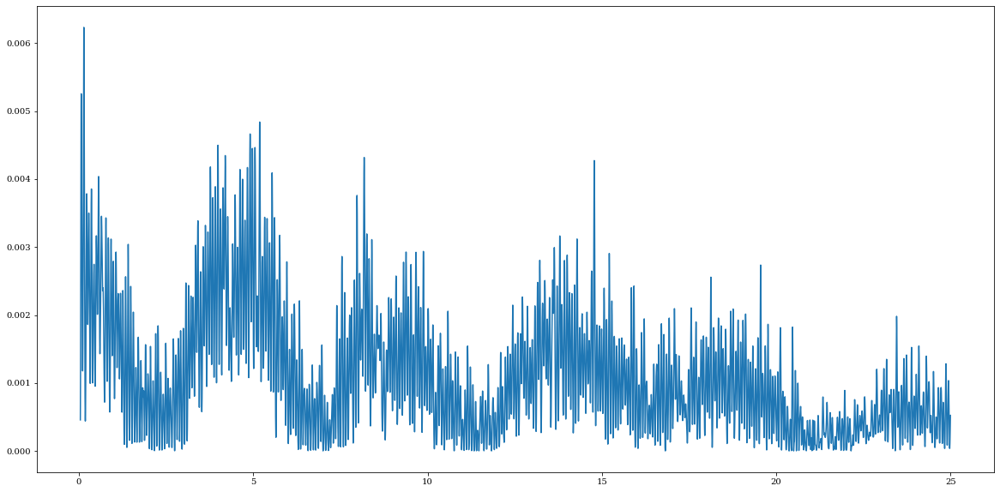

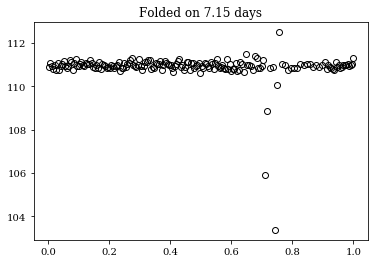

ValueError: array must not contain infs or NaNs

In [127]:
search_result = lk.search_tesscut('WD 0233−242')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

In [128]:
dm

regressors DesignMatrix (3445, 2499)

SearchResult containing 2 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0  TESS Sector 4 WD 0322−019         TESSCut      0.0
  1 TESS Sector 31 WD 0322−019         TESSCut      0.0


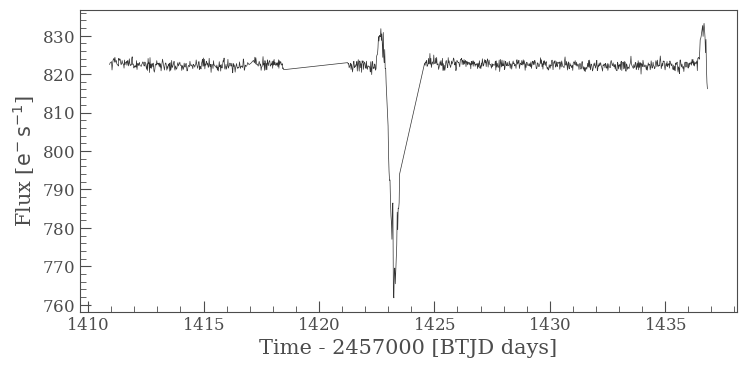

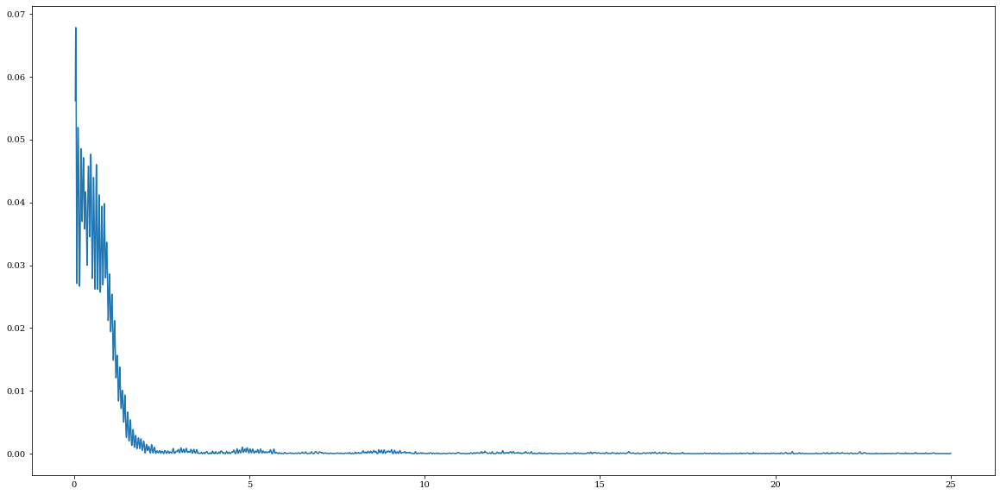

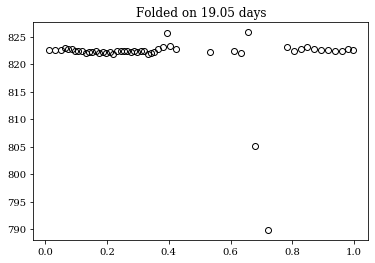

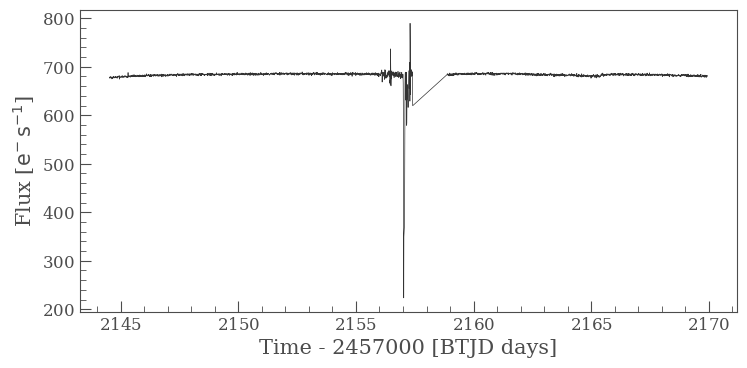

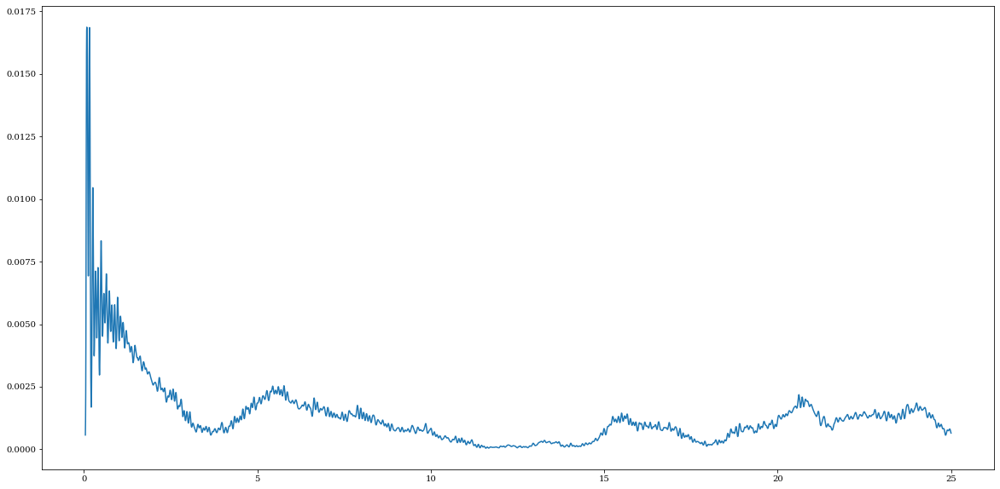

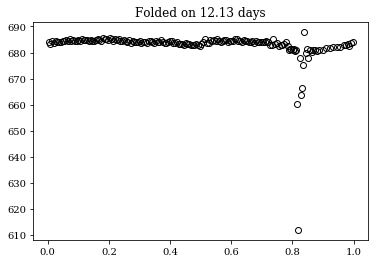

In [129]:
search_result = lk.search_tesscut('WD 0322−019')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

SearchResult containing 2 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0  TESS Sector 5 WD 0503−174         TESSCut      0.0
  1 TESS Sector 32 WD 0503−174         TESSCut      0.0


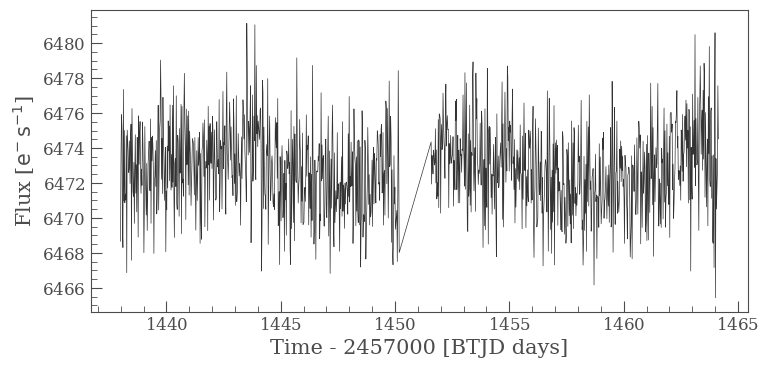

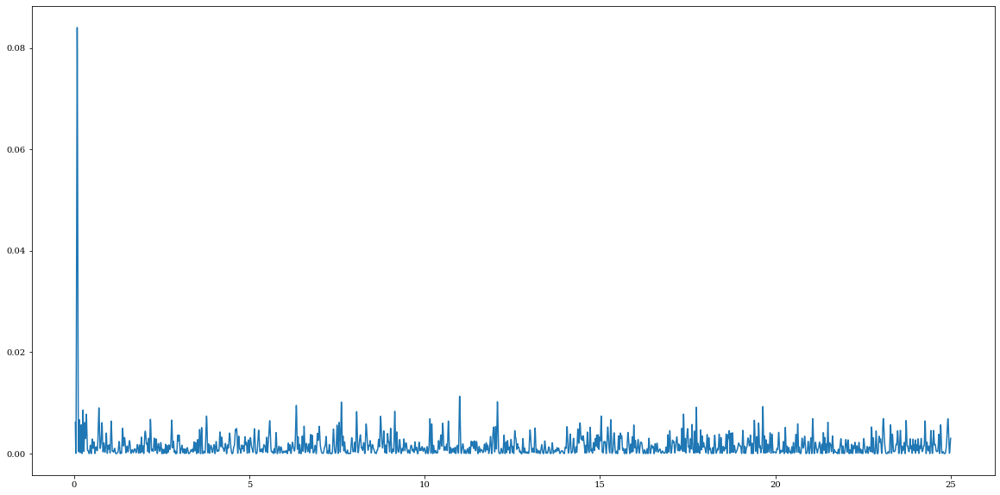

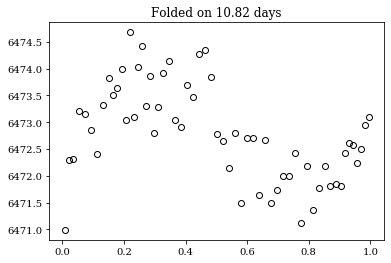

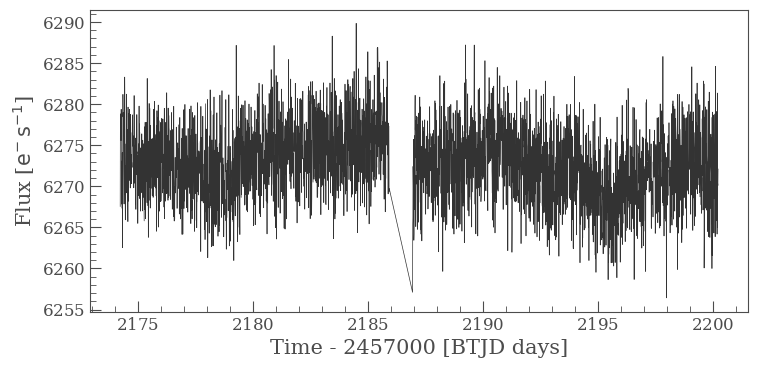

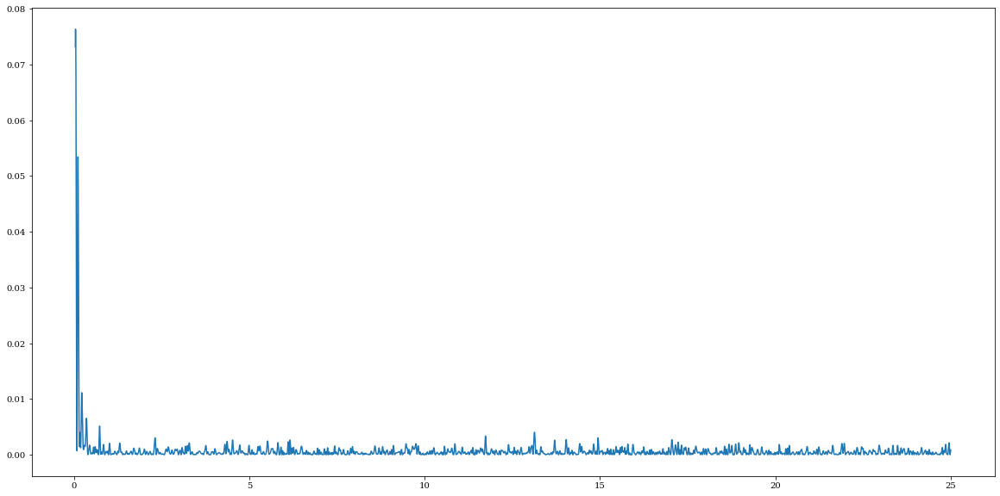

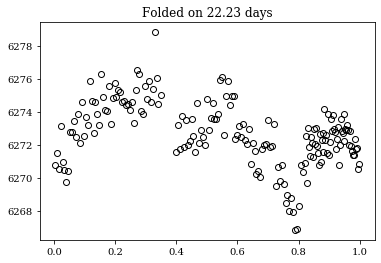

In [130]:
search_result = lk.search_tesscut('WD 0503−174')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

SearchResult containing 1 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0 TESS Sector 33 WD 0553+053         TESSCut      0.0


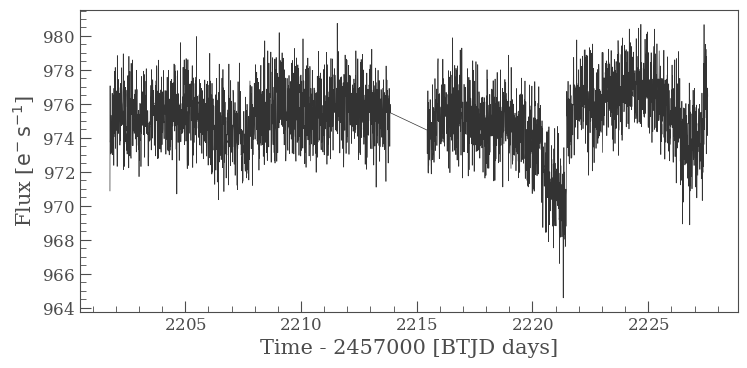

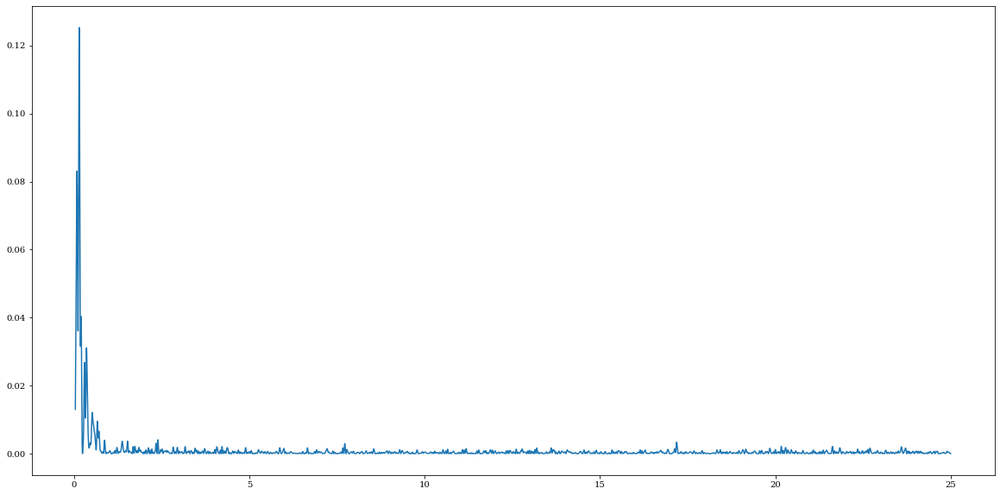

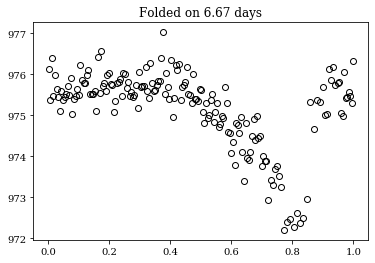

In [137]:
search_result = lk.search_tesscut('WD 0553+053')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

SearchResult containing 1 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0 TESS Sector 21 WD 1008+290         TESSCut      0.0


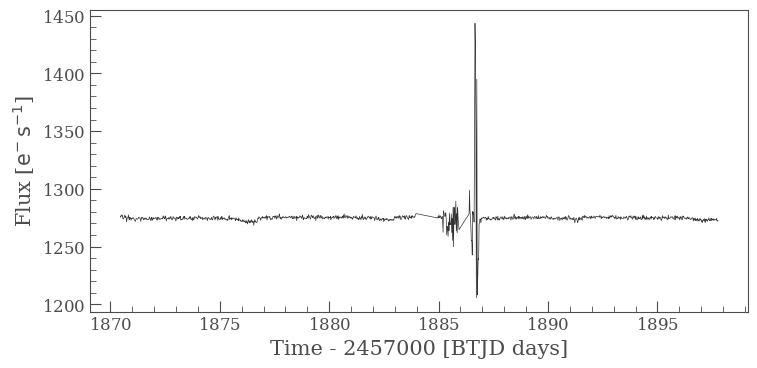

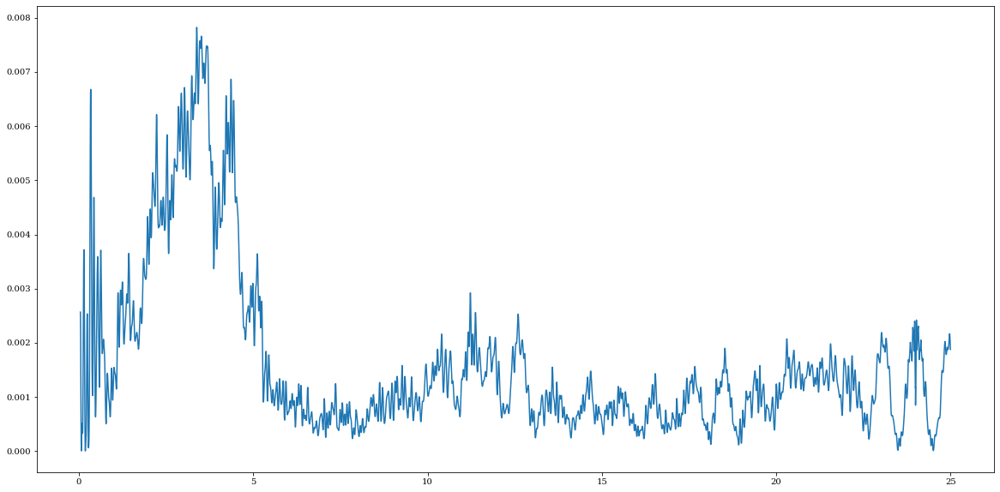

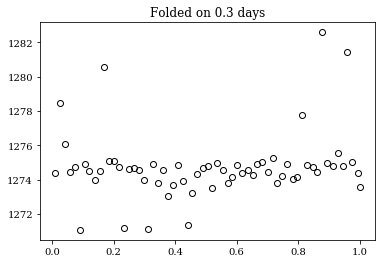

In [138]:
search_result = lk.search_tesscut('WD 1008+290')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

SearchResult containing 5 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0 TESS Sector 14 WD 1309+853         TESSCut      0.0
  1 TESS Sector 19 WD 1309+853         TESSCut      0.0
  2 TESS Sector 20 WD 1309+853         TESSCut      0.0
  3 TESS Sector 21 WD 1309+853         TESSCut      0.0
  4 TESS Sector 26 WD 1309+853         TESSCut      0.0


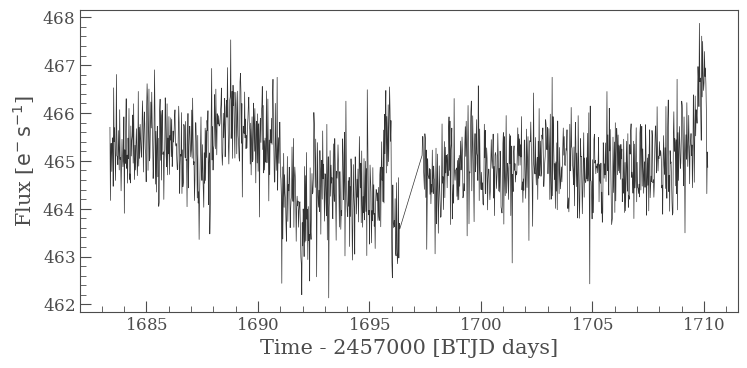

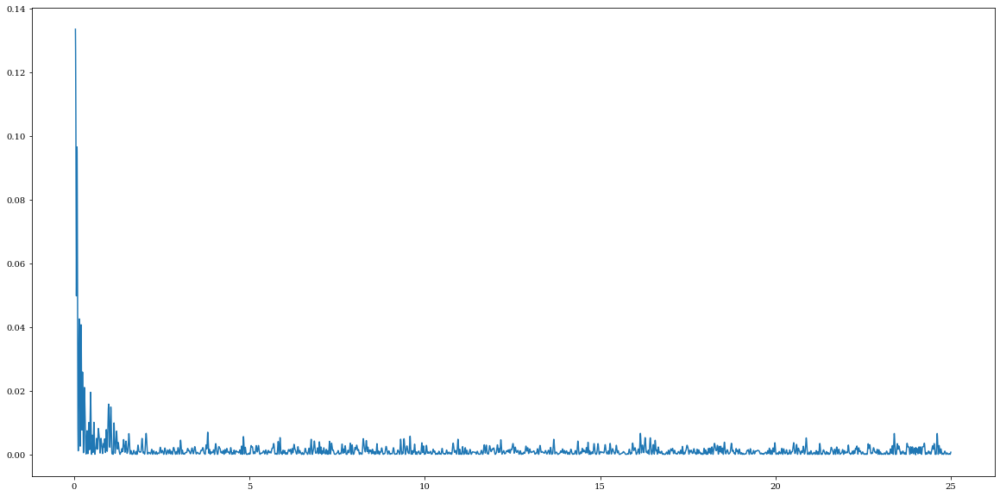

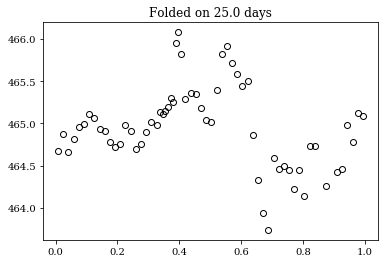

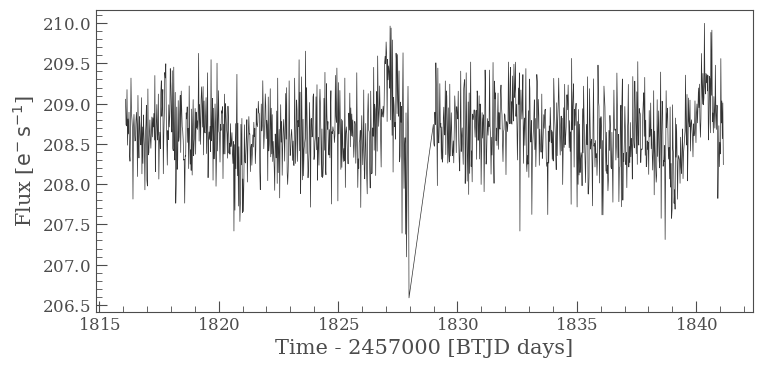

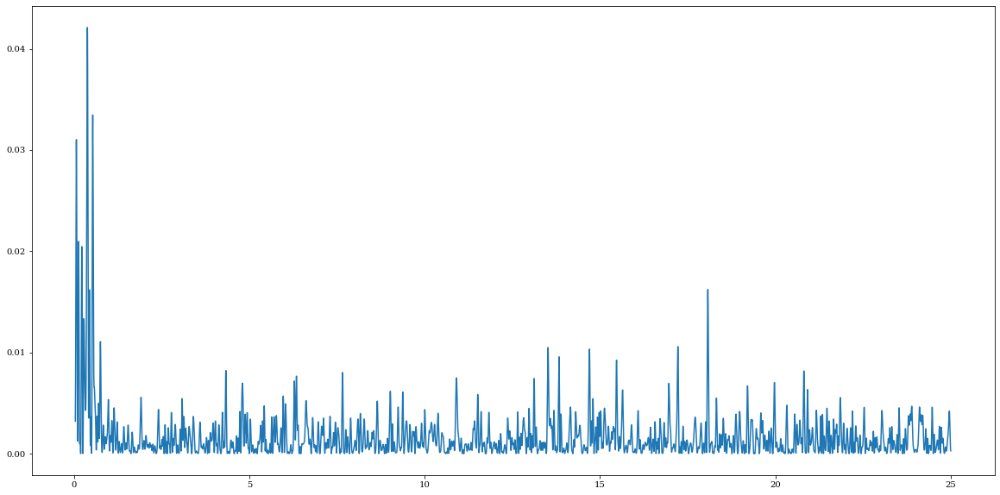

...

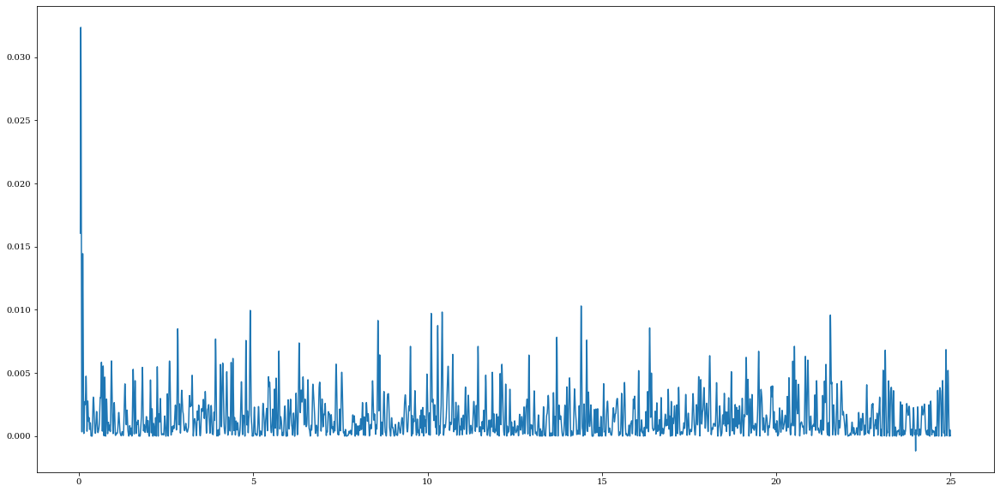

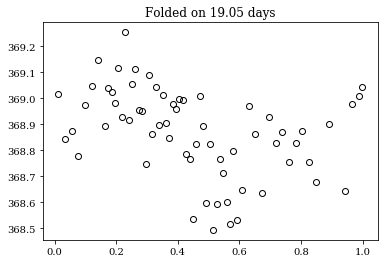

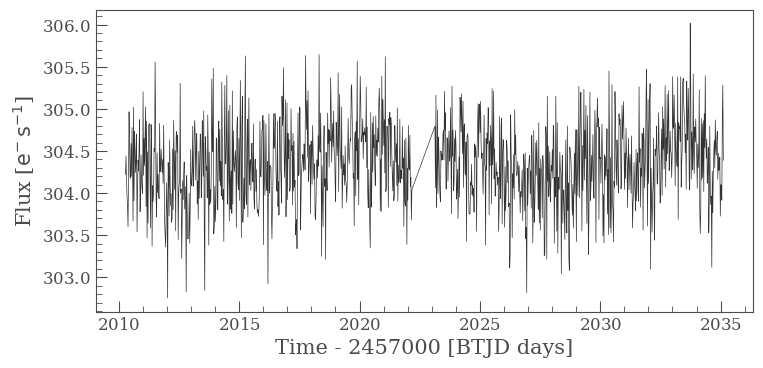

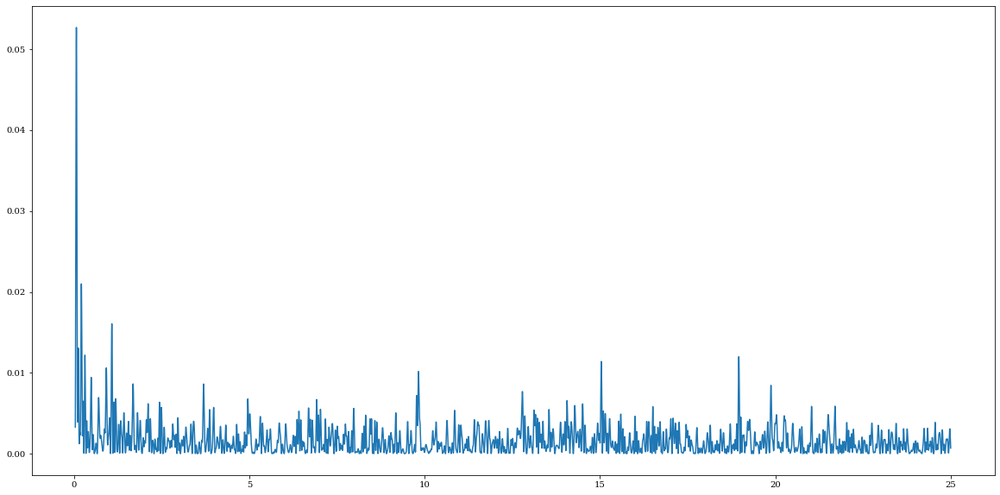

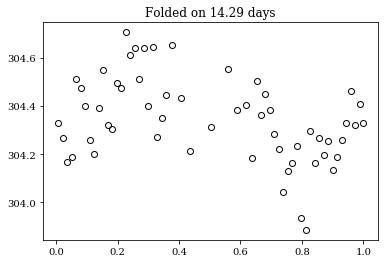

In [139]:
search_result = lk.search_tesscut('WD 1309+853')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

SearchResult containing 12 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0 TESS Sector 14 WD 1748+708         TESSCut      0.0
  1 TESS Sector 15 WD 1748+708         TESSCut      0.0
  2 TESS Sector 16 WD 1748+708         TESSCut      0.0
  3 TESS Sector 17 WD 1748+708         TESSCut      0.0
  4 TESS Sector 18 WD 1748+708         TESSCut      0.0
  5 TESS Sector 19 WD 1748+708         TESSCut      0.0
  6 TESS Sector 20 WD 1748+708         TESSCut      0.0
  7 TESS Sector 21 WD 1748+708         TESSCut      0.0
  8 TESS Sector 22 WD 1748+708         TESSCut      0.0
  9 TESS Sector 24 WD 1748+708         TESSCut      0.0
 10 TESS Sector 25 WD 1748+708         TESSCut      0.0
 11 TESS Sector 26 WD 1748+708         TESSCut      0.0


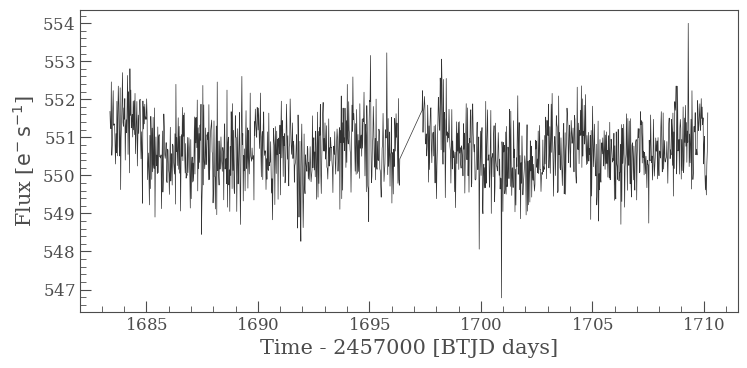

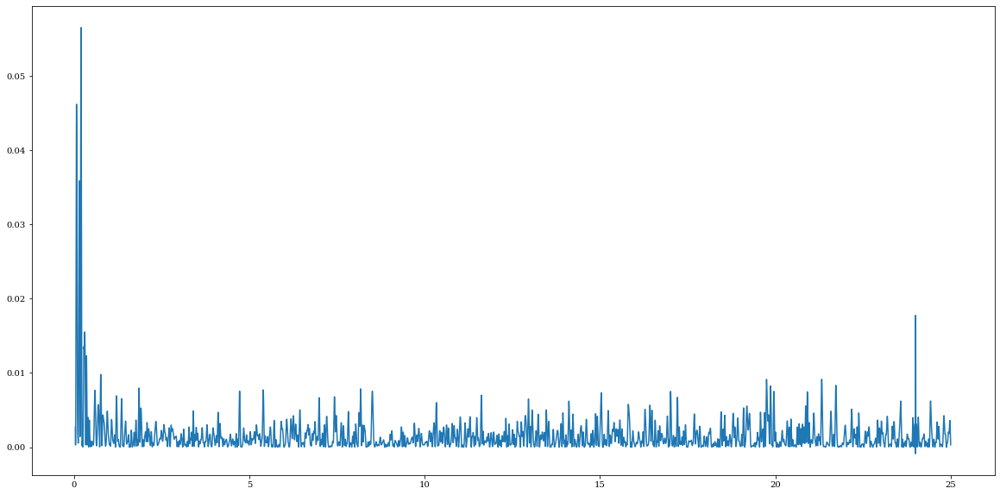

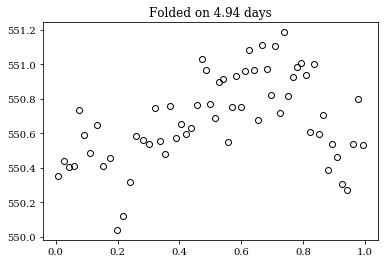

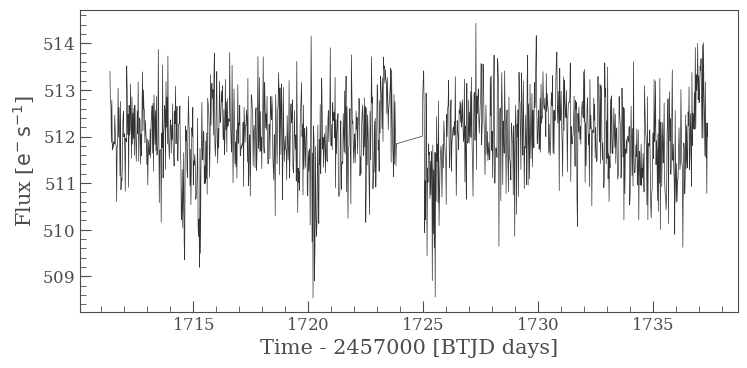

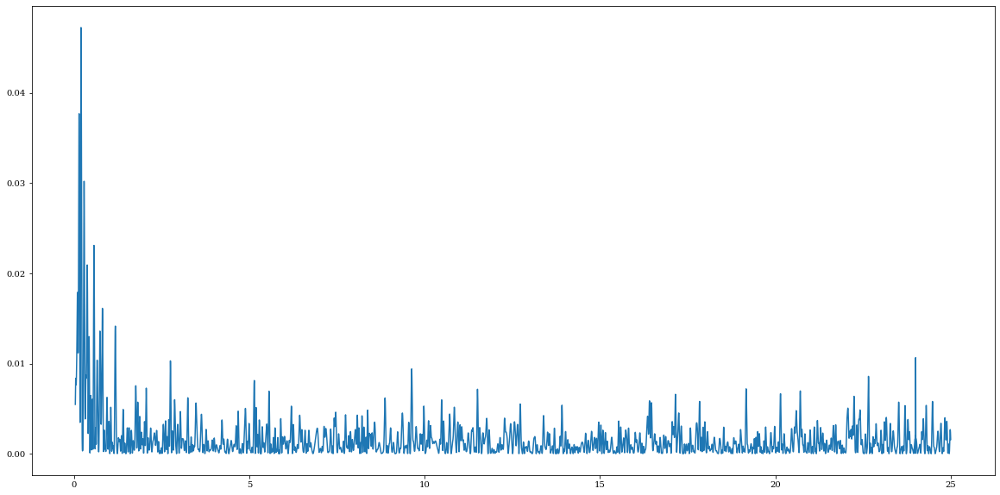

...

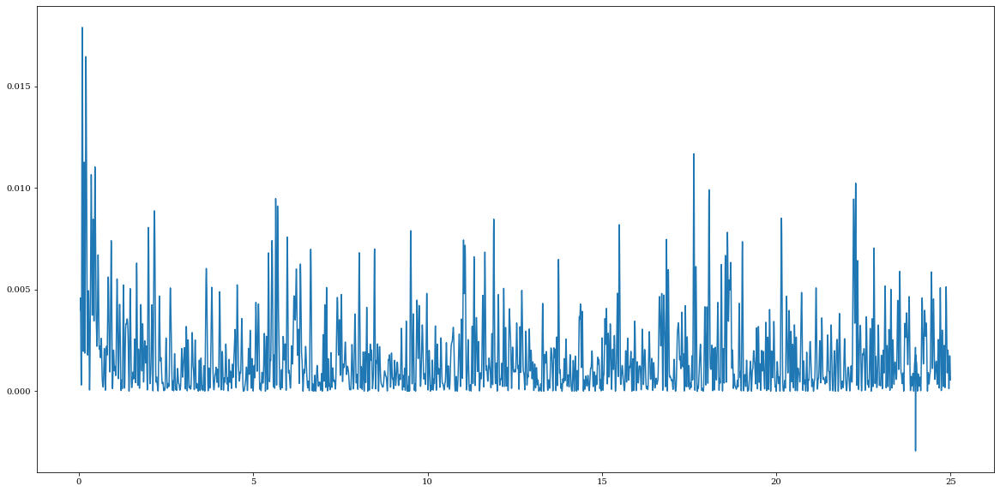

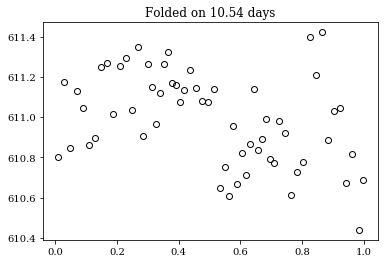

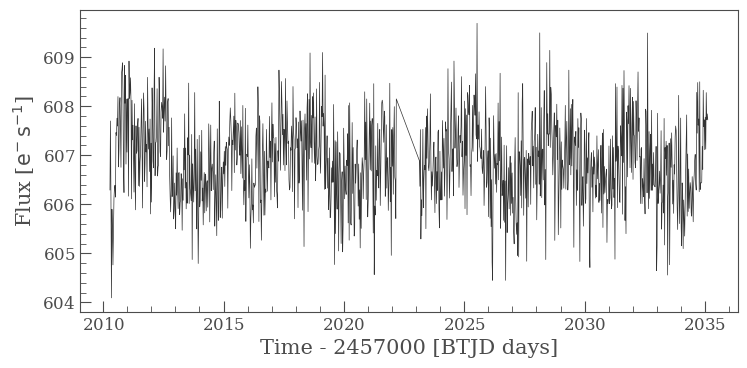

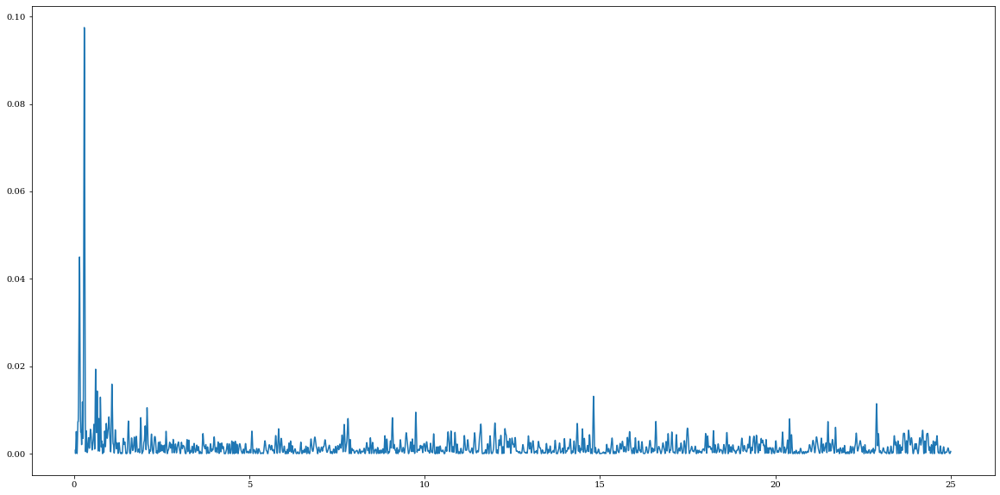

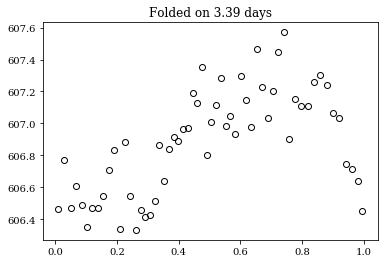

In [141]:
search_result = lk.search_tesscut('WD 1748+708')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

SearchResult containing 2 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0  TESS Sector 1 WD 2049−253         TESSCut      0.0
  1 TESS Sector 28 WD 2049−253         TESSCut      0.0


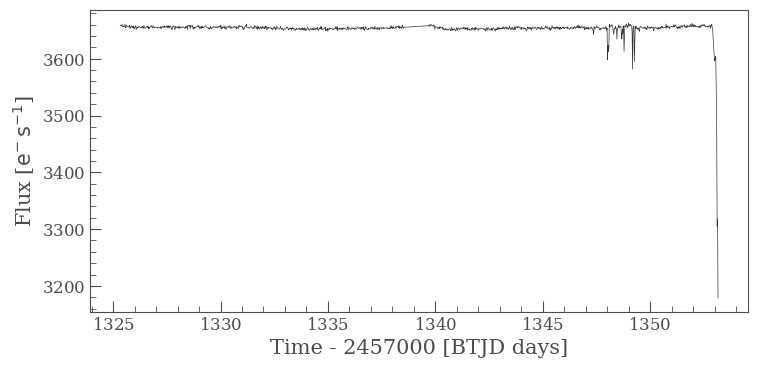

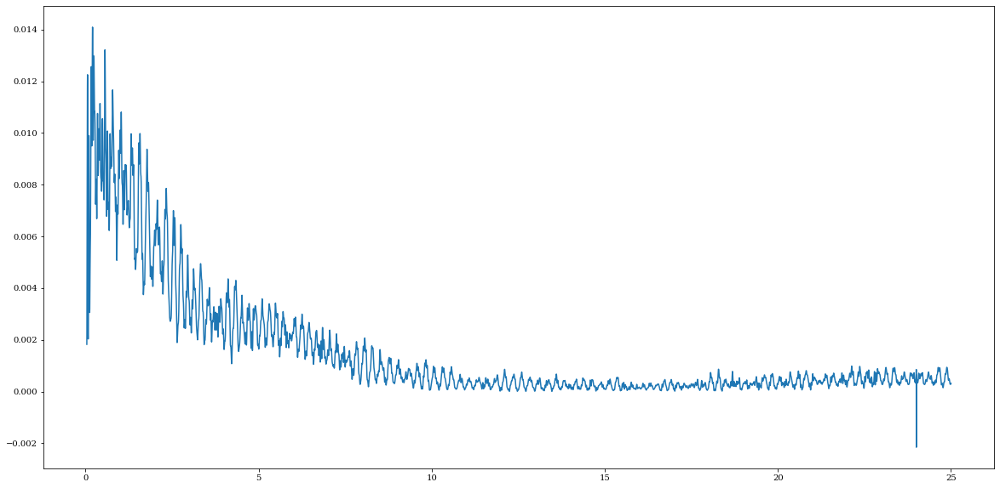

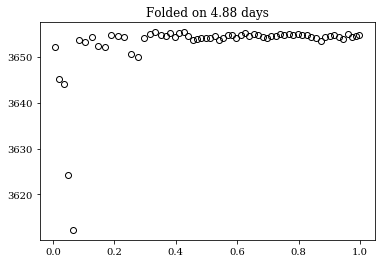

D:\conda\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in greater
  


AssertionError: 

In [142]:
search_result = lk.search_tesscut('WD 2049−253')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

SearchResult containing 2 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0 TESS Sector 13 WD 2105−820         TESSCut      0.0
  1 TESS Sector 27 WD 2105−820         TESSCut      0.0


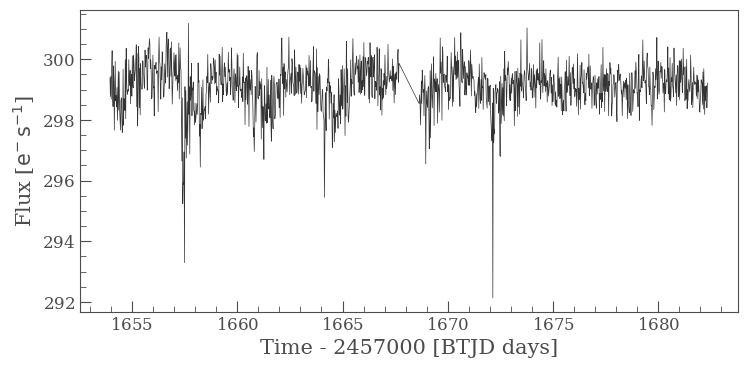

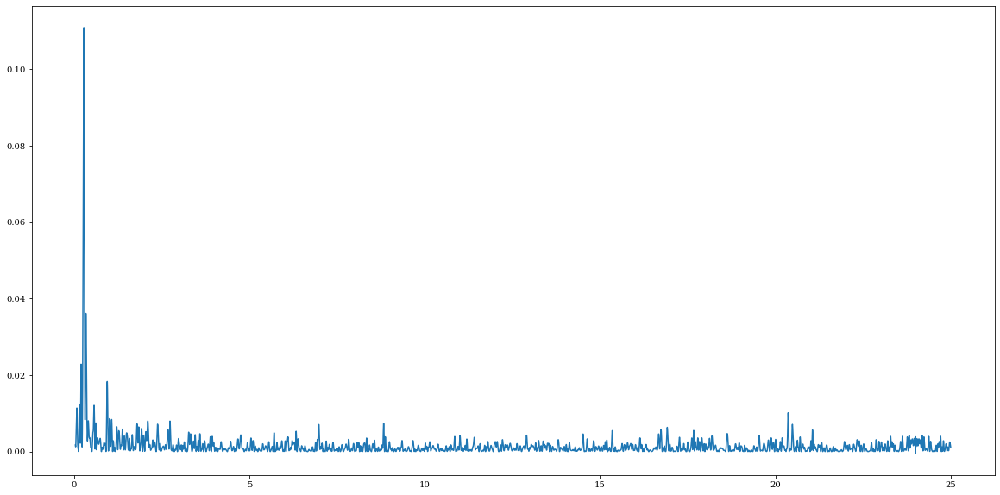

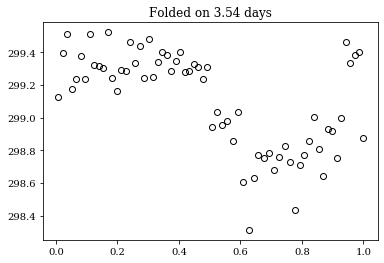

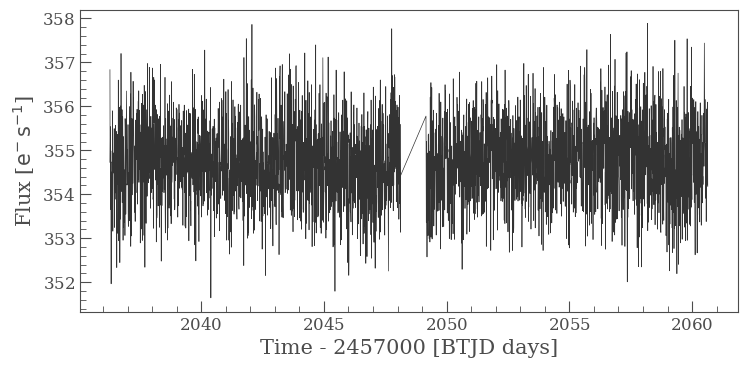

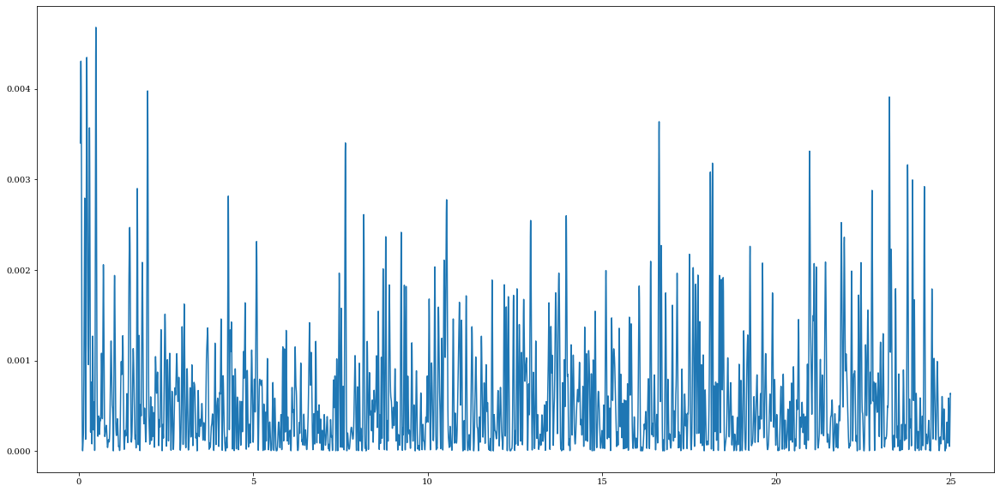

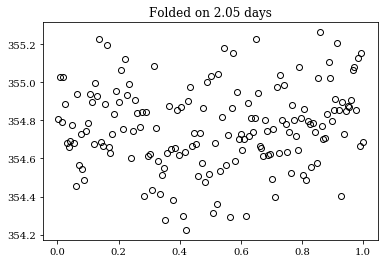

In [143]:
search_result = lk.search_tesscut('WD 2105−820')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

SearchResult containing 1 data products.

 #   observation   target_name productFilename distance
--- -------------- ----------- --------------- --------
  0 TESS Sector 28 WD 2138−332         TESSCut      0.0


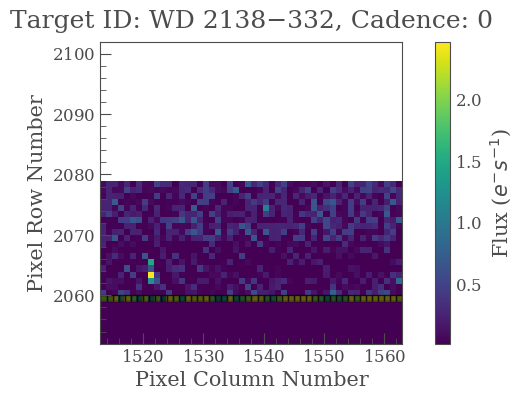

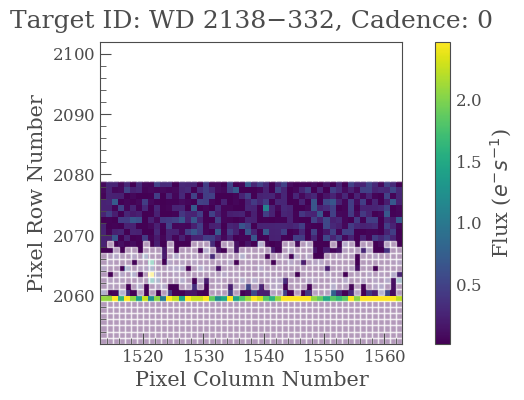

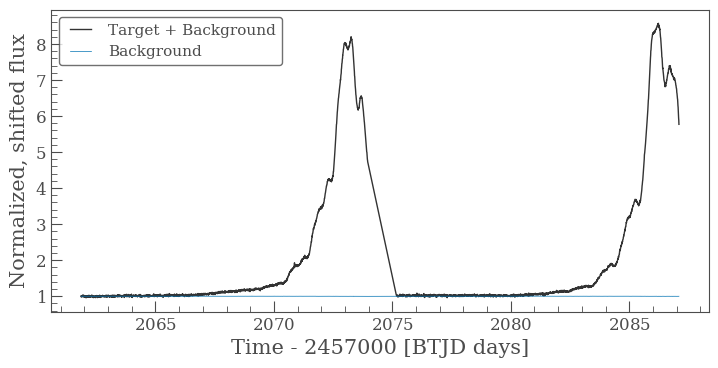

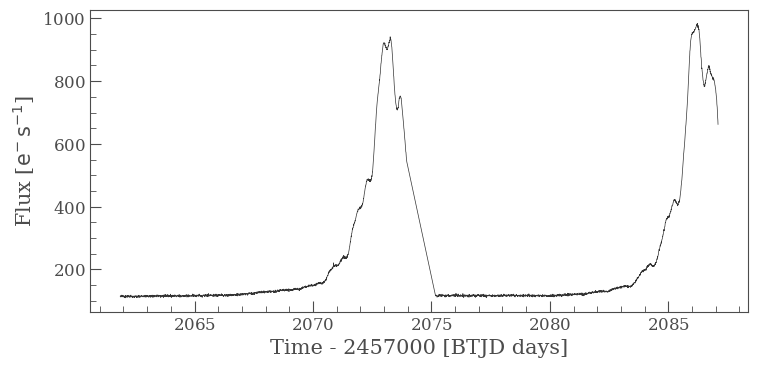

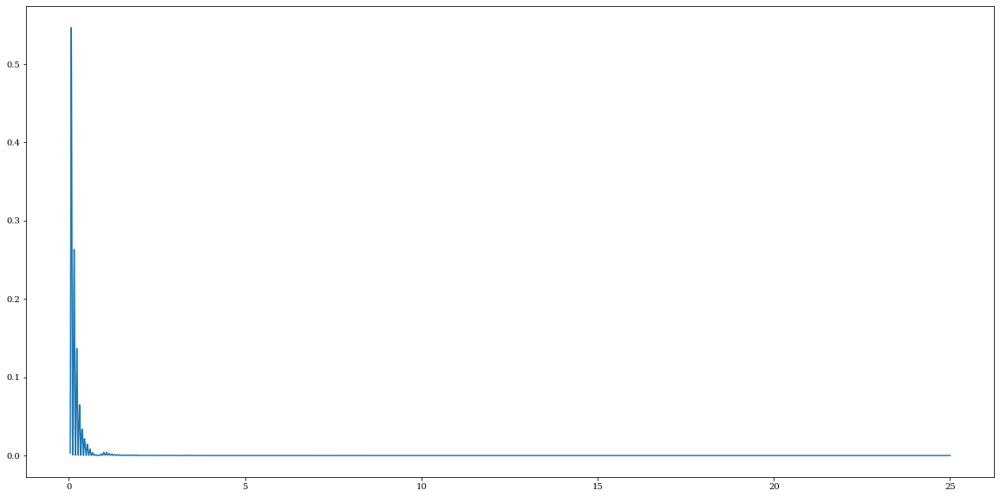

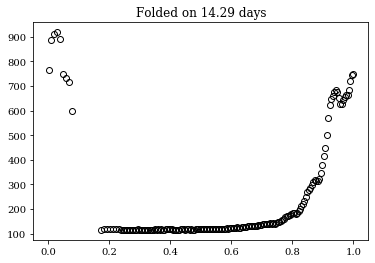

In [146]:
search_result = lk.search_tesscut('WD 2138−332')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    tpf.plot(aperture_mask=target_mask, mask_color='k')
    target_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    background_mask = ~tpf.create_threshold_mask(threshold=0.001, reference_pixel=None)
    tpf.plot(aperture_mask=background_mask, mask_color='w')
    n_background_pixels = background_mask.sum()
    background_lc_per_pixel = tpf.to_lightcurve(aperture_mask=background_mask) / n_background_pixels
    background_estimate_lc = background_lc_per_pixel * n_target_pixels
    common_normalization = np.nanpercentile(target_lc.flux, 10)
    ax = (target_lc / common_normalization).plot(normalize=False, label='Target + Background', lw=1);(background_estimate_lc / common_normalization +1).plot(ax=ax, normalize=False, label='Background',ylabel='Normalized, shifted flux')
    corrected_lc = target_lc - background_estimate_lc.flux
    corrected_lc.plot()
#plt.savefig('sec22SBSS1310.pdf')
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

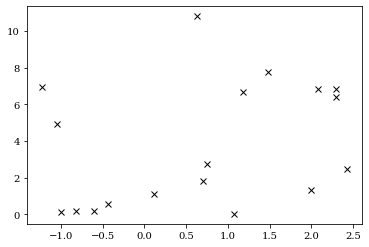

In [149]:
per = [0.11,0.17,0.59,0.03,10.8,1.82,6.67,6.85,7.78,4.91,1.33,0.2,2.49,2.73,6.85,
    6.41,6.97,1.13]
field = [0.1,0.25,0.37,12,4.3,5,15,200,30,0.09,100,0.15,265,5.6,120,200,0.06,
        1.3]

plt.plot(np.log10(field), per, 'kx')

In [154]:
perH = np.array(per)*24
perH

array([  2.64,   4.08,  14.16,   0.72, 259.2 ,  43.68, 160.08, 164.4 ,
       186.72, 117.84,  31.92,   4.8 ,  59.76,  65.52, 164.4 , 153.84,
       167.28,  27.12])

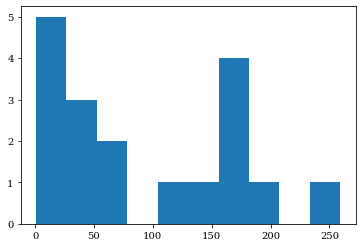

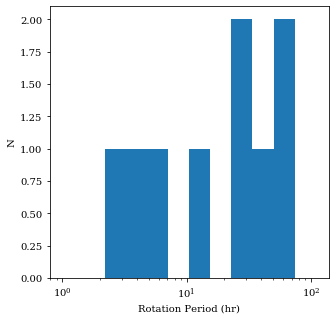

In [165]:
plt.hist(perH)
plt.show()

plt.figure(figsize=(5,5))
bins = 10**(np.linspace(0,2.04,13))
plt.xscale('log')
plt.ylabel('N')
plt.hist(perH,bins=bins) 
plt.xlabel('Rotation Period (hr)')
plt.savefig('MWDHistogram.pdf')

In [159]:
np.arange(0,3.04)

array([0., 1., 2., 3.])

In [2]:
search_result = lk.search_tesscut('WD 2138-332')
search_result

#,observation,target_name,productFilename,distance
0,TESS Sector 28,WD 2138-332,TESSCut,0.0


In [6]:
search_result = lk.search_tesscut('WD 1350-090')
print(search_result)
for i in range(len(search_result)):
    tpf = search_result[i].download(cutout_size=50)
    target_mask = tpf.create_threshold_mask(threshold=15, reference_pixel='center')
    n_target_pixels = target_mask.sum()
    tpf.plot(aperture_mask=target_mask, mask_color='k')
    regressors = tpf.flux[:, ~target_mask]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    raw_lc = tpf.to_lightcurve(aperture_mask=target_mask)
    
    regressors = tpf.flux[:, ~target_mask]
    regressors = regressors[raw_lc.flux_err > 0]
    dm = lk.DesignMatrix(regressors, name='regressors')
    dm = dm.pca(5)
    dm = dm.append_constant()
    
    raw_lc = raw_lc[raw_lc.flux_err > 0]
    #raw_lc = raw_lc.flux_err.remove_nans()
    corrector = lk.RegressionCorrector(raw_lc)
    corrected_lc = corrector.correct(dm)
    corrected_lc.plot()
    
    
    
    
    flux = corrected_lc.flux
    time = corrected_lc.time
    freq = np.linspace(0.04, 25, 10000)
    power = LombScargle(time, flux).power(freq)
    bestPeriod = 1/freq[np.argmax(power)]
    plt.figure(figsize=(20,10))
    plt.plot(freq,power)
    plt.show()
    phases = foldMeth(time, bestPeriod)
        
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = flux[sortIndi]
    flux = np.nanmean(np.pad(flux.astype(float), (0, 20 - flux.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    phases = np.nanmean(np.pad(phases.astype(float), (0, 20 - phases.size%20), mode='constant', constant_values=np.NaN).reshape(-1, 20), axis=1)
    plt.plot(phases, flux, marker='o',mfc='none', c='k',ls='')
    plt.title('Folded on '+ str(np.round(bestPeriod,decimals=2)) +' days')
    plt.show()

No data found for target "WD 1350-090".


SearchResult containing 0 data products.


1.5227461746174618


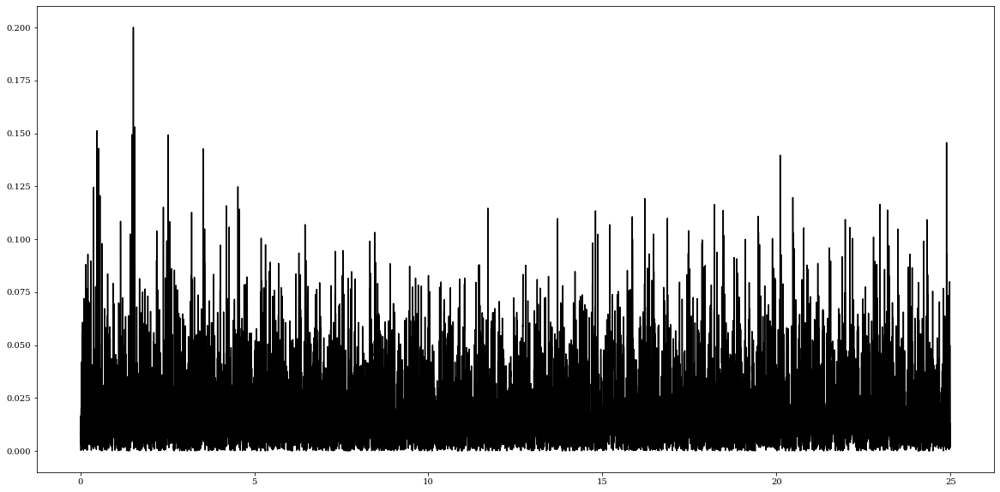

In [4]:
import pandas as pd
data1 = pd.read_csv('/home/nwal/Desktop/Random-Astro-master/ztfMag/wd1350.csv', delimiter=',')
data1 = data1[data1["catflags"] < 1]
timeZTF1 = data1['mjd']
fluxZTF1 = data1['mag']
fluxZTF1Old = fluxZTF1
zeroMag = data1['magzp']
#fluxZTF1 = 30/(10**((-fluxZTF1+zeroMag)/2.5))
timeZTF1 = timeZTF1#-2457000
#fluxZTF1 = (10**((-fluxZTF1)))
#fluxZTF1 = 1000/(10**((fluxZTF1+26.74)/2.5))
#fluxZTF1 = 30*10**((zeroMag-fluxZTF1)/2.5)
fluxZTF1 = 3.631*(10**(-fluxZTF1/2.5))#jay's way
fluxZTF1 = (fluxZTF1/np.mean(fluxZTF1))-1
freq = np.linspace(0.0001,25,10000)
powerPl = LombScargle(timeZTF1,fluxZTF1).power(freq)
plt.figure(figsize=(20,10))
#plt.plot([12.45,12.45], [0,max(powerPl)])
plt.plot(freq,powerPl, c='k')
print(freq[np.argmax(powerPl)])

0      58228.450880
1      58246.454734
2      58249.439375
3      58249.475590
4      58252.482072
           ...     
502    59313.456933
503    59316.496273
504    59320.492095
505    59323.482662
506    59328.415266
Name: mjd, Length: 485, dtype: float64
0.9676928892889289


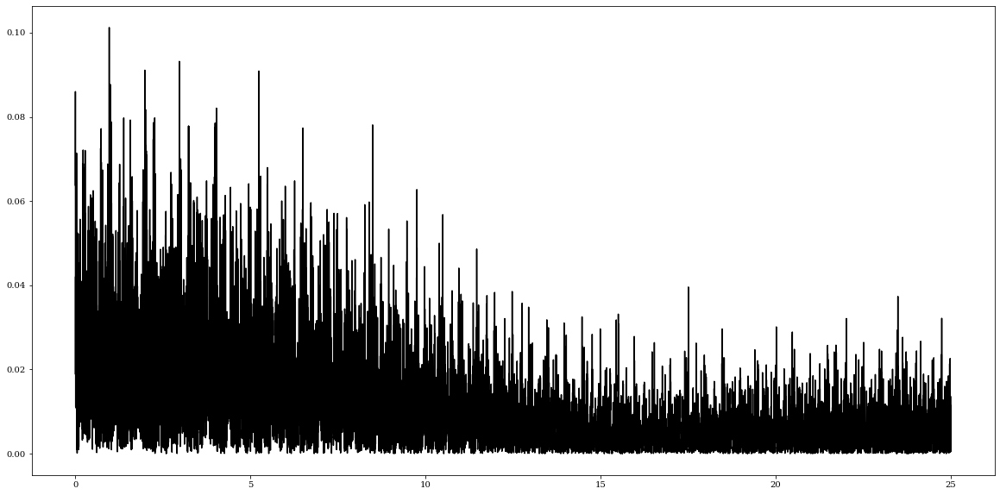

In [14]:
import pandas as pd
data1 = pd.read_csv('/home/nwal/Desktop/Random-Astro-master/ztfMag/wd1953.csv', delimiter=',')
data1 = data1[data1["catflags"] < 1]
timeZTF1 = data1['mjd']
print(timeZTF1)
fluxZTF1 = data1['mag']
fluxZTF1Old = fluxZTF1
zeroMag = data1['magzp']
#fluxZTF1 = 30/(10**((-fluxZTF1+zeroMag)/2.5))
timeZTF1 = timeZTF1#-2457000
#fluxZTF1 = (10**((-fluxZTF1)))
#fluxZTF1 = 1000/(10**((fluxZTF1+26.74)/2.5))
#fluxZTF1 = 30*10**((zeroMag-fluxZTF1)/2.5)
fluxZTF1 = 3.631*(10**(-fluxZTF1/2.5))#jay's way
fluxZTF1 = (fluxZTF1/np.mean(fluxZTF1))-1
freq = np.linspace(0.0001,25,10000)
powerPl = LombScargle(timeZTF1,fluxZTF1).power(freq)
plt.figure(figsize=(20,10))
#plt.plot([12.45,12.45], [0,max(powerPl)])
plt.plot(freq,powerPl, c='k')
print(freq[np.argmax(powerPl)])

13.686413891389138


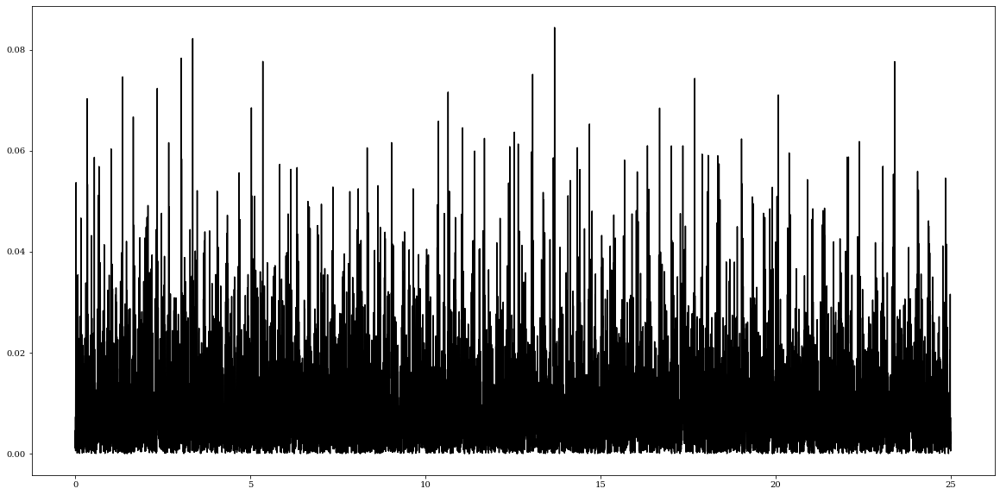

In [17]:
import pandas as pd
data1 = pd.read_csv('/home/nwal/Desktop/toEmail/32/SDSS J155720.77.csv', delimiter=',')
data1 = data1[data1["catflags"] < 1]
timeZTF1 = data1['mjd']
fluxZTF1 = data1['mag']
fluxZTF1Old = fluxZTF1
zeroMag = data1['magzp']
#fluxZTF1 = 30/(10**((-fluxZTF1+zeroMag)/2.5))
timeZTF1 = timeZTF1#-2457000
#fluxZTF1 = (10**((-fluxZTF1)))
#fluxZTF1 = 1000/(10**((fluxZTF1+26.74)/2.5))
#fluxZTF1 = 30*10**((zeroMag-fluxZTF1)/2.5)
fluxZTF1 = 3.631*(10**(-fluxZTF1/2.5))#jay's way
fluxZTF1 = (fluxZTF1/np.mean(fluxZTF1))-1
freq = np.linspace(0.0001,25,10000)
powerPl = LombScargle(timeZTF1,fluxZTF1).power(freq)
plt.figure(figsize=(20,10))
#plt.plot([12.45,12.45], [0,max(powerPl)])
plt.plot(freq,powerPl, c='k')
print(freq[np.argmax(powerPl)])

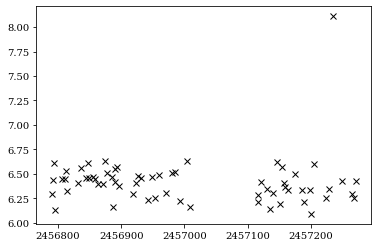

5.723149414941494


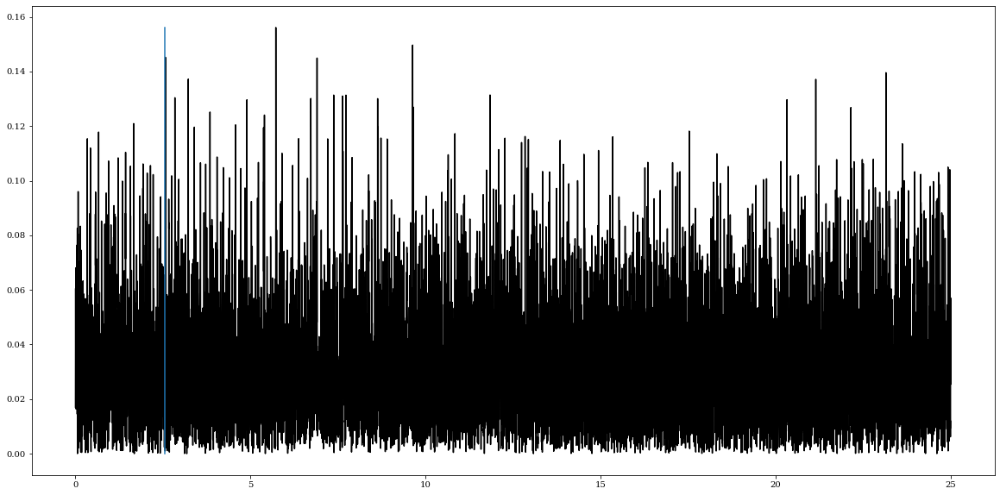

(6, 7)

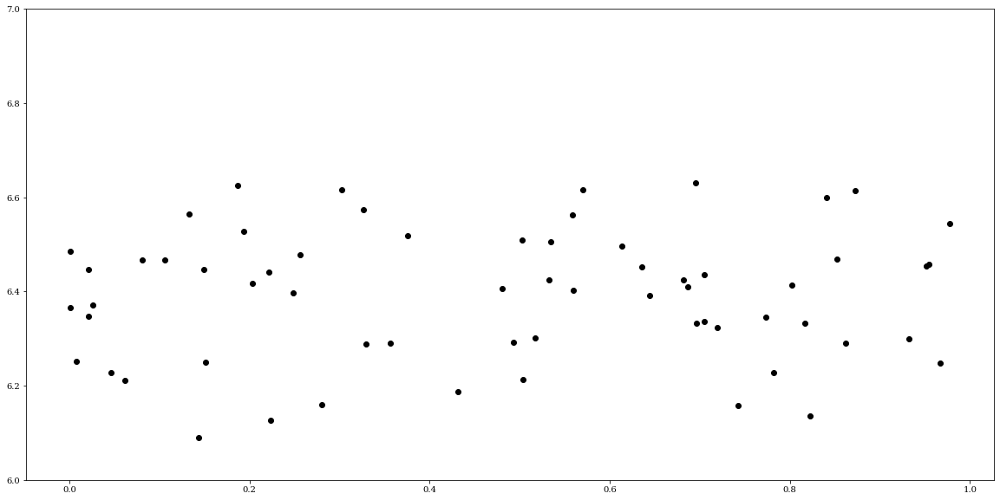

In [10]:
import pandas as pd
data1 = pd.read_csv('ASSASN_BF.csv', delimiter=',', names=['time', 'flux'])
data1
time = data1['time']
flux = data1['flux']
plt.plot(time,flux, 'kx')
plt.show()
freq = np.linspace(0.0001,25,10000)
powerPl = LombScargle(time,flux).power(freq)
plt.figure(figsize=(20,10))
#plt.plot([12.45,12.45], [0,max(powerPl)])
plt.plot(freq,powerPl, c='k')
print(freq[np.argmax(powerPl)])
plt.plot([2.55319148936,2.55319148936], [0, max(powerPl)])
plt.show()

phases = foldMeth(time, 5.723149414941494)
plt.figure(figsize=(20,10))
plt.plot(phases, flux, 'ko')
plt.ylim(6,7)

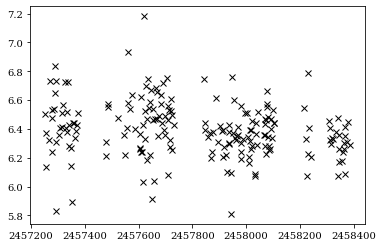

24.179921272127213


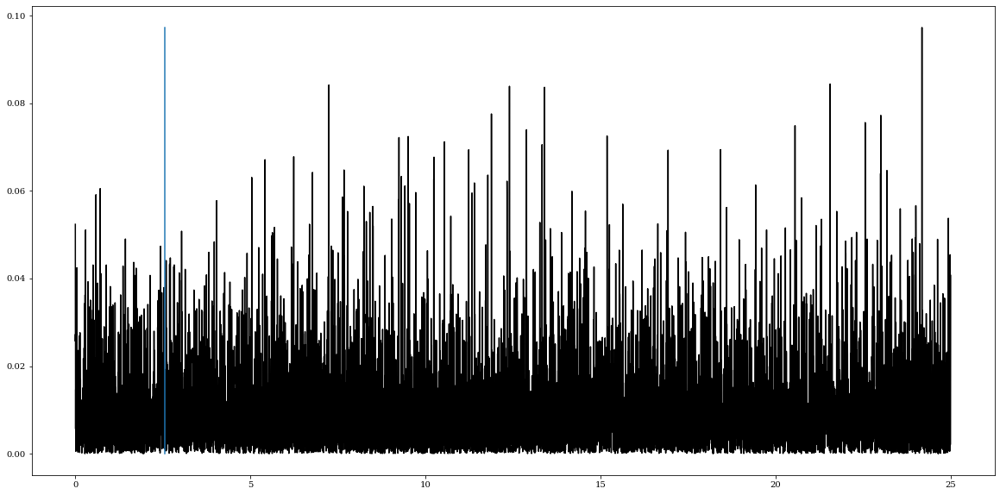

In [11]:
import pandas as pd
data1 = pd.read_csv('ASSASN_BH.csv', delimiter=',', names=['time', 'flux'])
data1
time = data1['time']
flux = data1['flux']
plt.plot(time,flux, 'kx')
plt.show()
freq = np.linspace(0.0001,25,10000)
powerPl = LombScargle(time,flux).power(freq)
plt.figure(figsize=(20,10))
#plt.plot([12.45,12.45], [0,max(powerPl)])
plt.plot(freq,powerPl, c='k')
print(freq[np.argmax(powerPl)])
plt.plot([2.55319148936,2.55319148936], [0, max(powerPl)])
plt.show()

#phases = foldMeth(time, 5.723149414941494)
#plt.figure(figsize=(20,10))
#plt.plot(phases, flux, 'ko')
#plt.ylim(6,7)

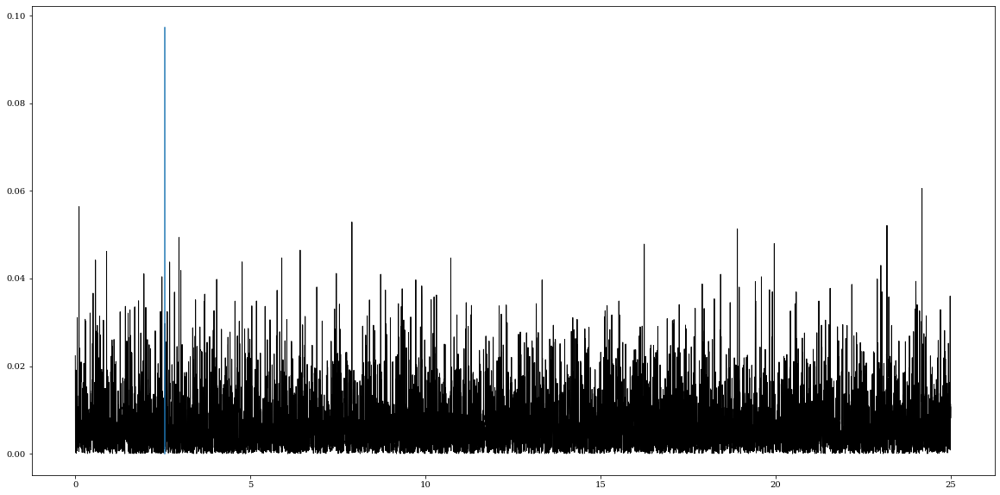

In [17]:
from gatspy import periodic
data1 = pd.read_csv('ASSASN_BH.csv', delimiter=',', names=['time', 'flux', 'err'])
data1
timeBH = data1['time']
fluxBH = data1['flux']
errBH = data1['err']
data1 = pd.read_csv('ASSASN_BF.csv', delimiter=',', names=['time', 'flux', 'err'])
data1
timeBF = data1['time']
fluxBF = data1['flux']
errBF = data1['err']

time = np.concatenate((timeBF, timeBH))
magsF = np.concatenate((fluxBF, fluxBH))
dyF = np.concatenate((errBF,errBH))

filtBF = np.take(list('BF'), np.arange(len(errBF)), mode='wrap')
filtBH = np.take(list('BH'), np.arange(len(errBH)), mode='wrap')


filF = np.concatenate((filtBF, filtBH))
#periods = np.linspace(0.025, 10, 10000)
freq = np.linspace(0.001, 25, 10000)
periods = 1/freq
LS_multi = periodic.LombScargleMultiband(Nterms_base=1, Nterms_band=0)
LS_multi.fit(time, magsF, dyF, filF)
P_multi = LS_multi.periodogram(periods)

plt.figure(figsize=(20,10))

plt.plot(1/periods, P_multi, lw=1, color='k')
plt.plot([2.55319148936,2.55319148936], [0, max(powerPl)])


In [15]:
np.shape(magsF)

(263,)

272.3672913291329


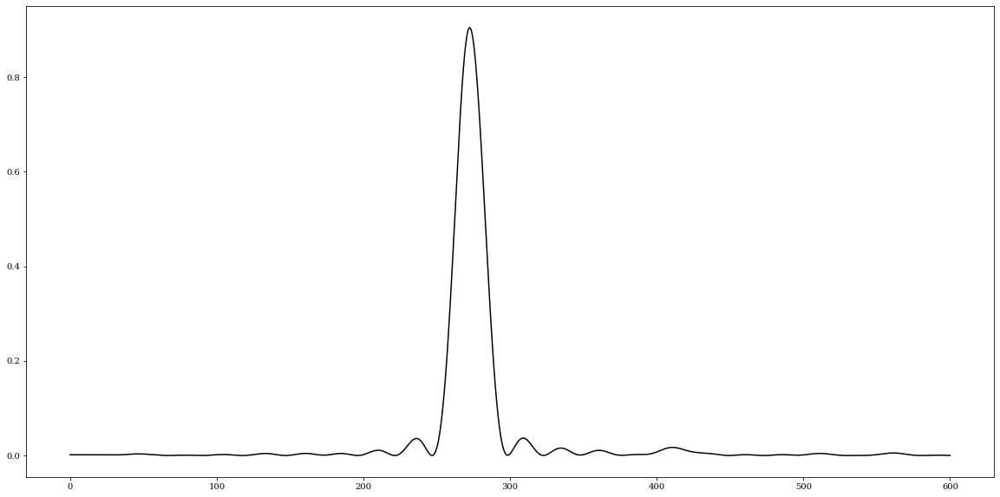

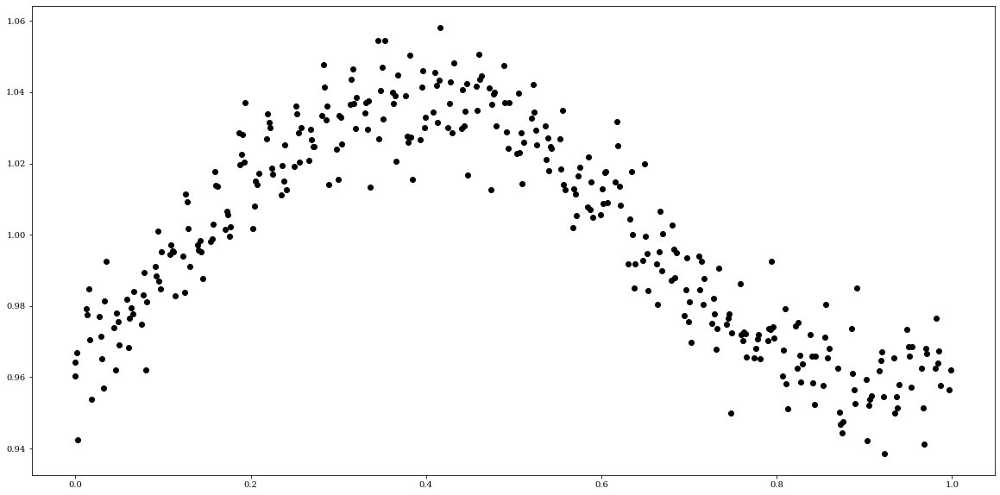

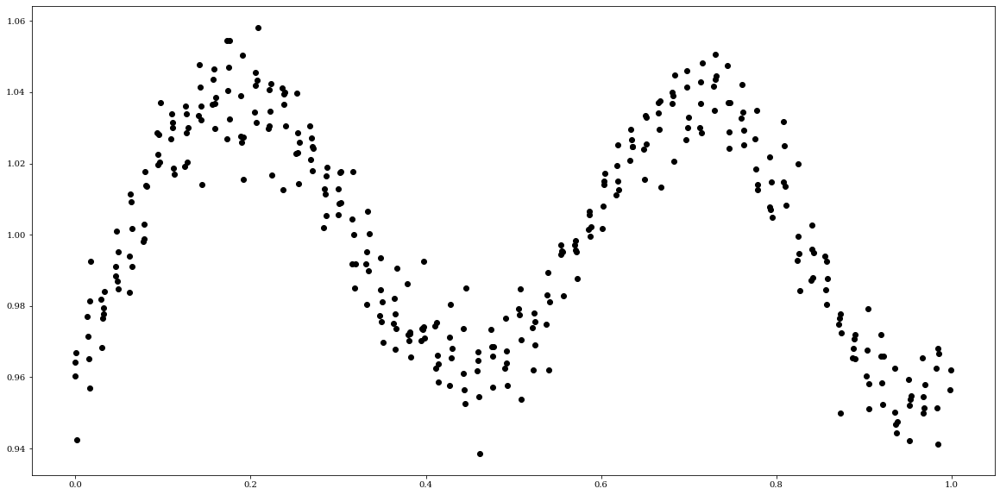

In [33]:
indata = np.loadtxt('J1252/sdss1252gr_1.dat', usecols=(0,1))
date = indata[:,0]
date = date-np.min(date)
flux = indata[:,1]
freq = np.linspace(0.0001,600,10000)
powerPl = LombScargle(date,flux).power(freq)
plt.figure(figsize=(20,10))
plt.plot(freq,powerPl, c='k')
print(freq[np.argmax(powerPl)])
#plt.savefig('gr_1.pdf')

phases = foldMeth(date, 1/272.3672913291329)
plt.figure(figsize=(20,10))
plt.plot(phases, flux, 'ko')
plt.show()

phases = foldMeth(date, 1/(272.3672913291329/2))
plt.figure(figsize=(20,10))
plt.plot(phases, flux, 'ko')


272.42729731973196


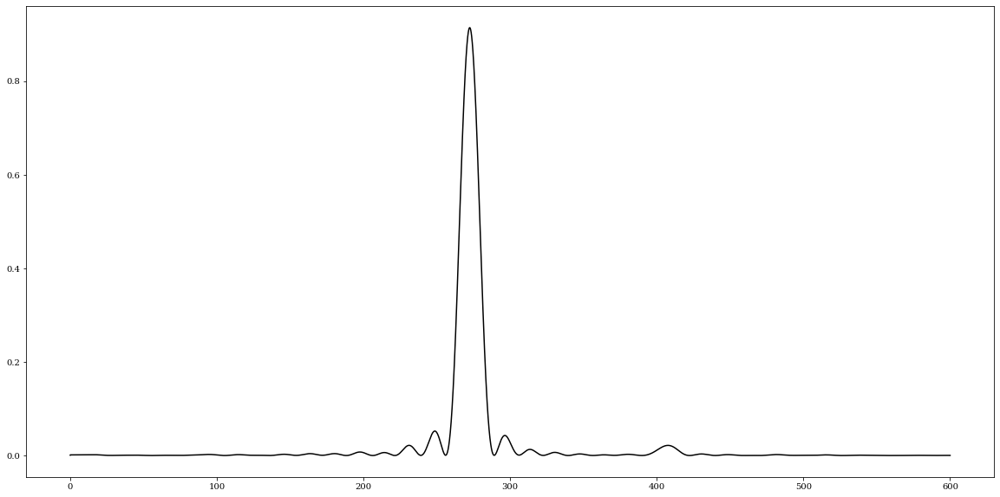

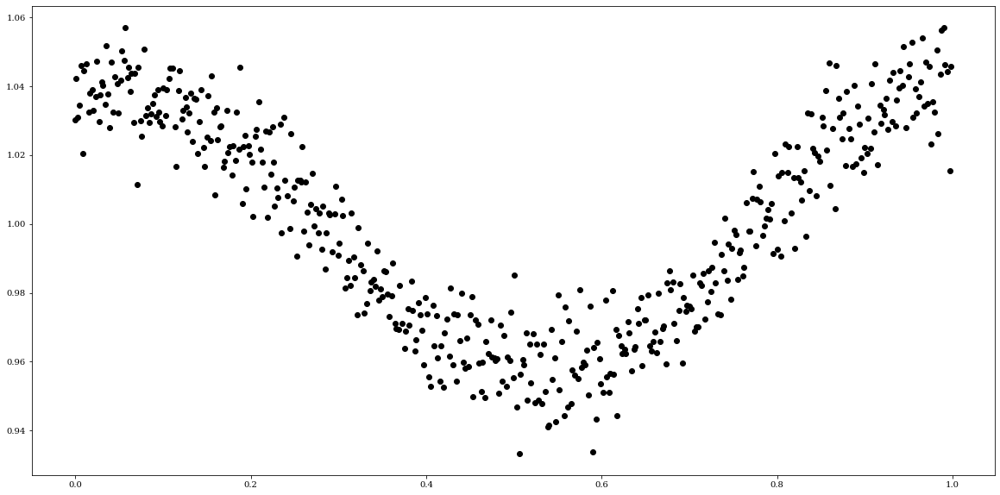

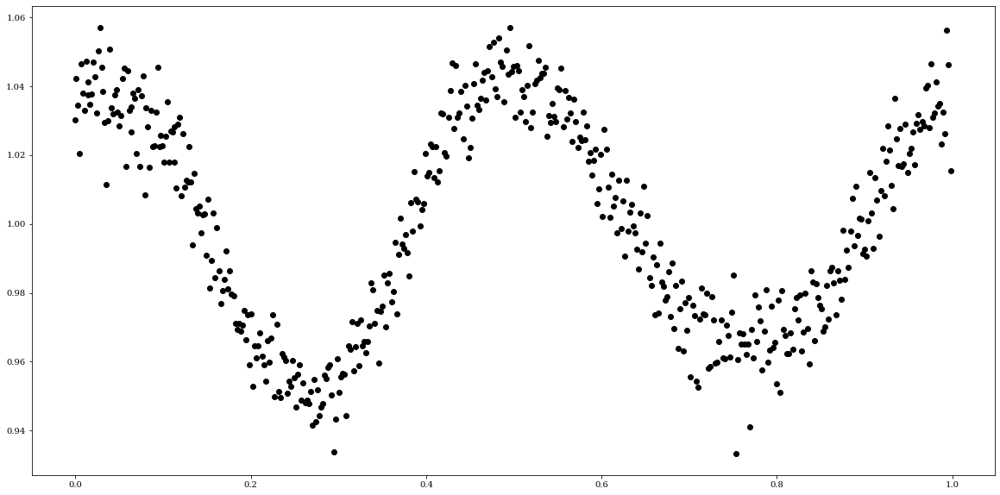

In [34]:
indata = np.loadtxt('J1252/sdss1252gr_2.dat', usecols=(0,1))
date = indata[:,0]
date = date-np.min(date)
flux = indata[:,1]
freq = np.linspace(0.0001,600,10000)
powerPl = LombScargle(date,flux).power(freq)
plt.figure(figsize=(20,10))
plt.plot(freq,powerPl, c='k')
print(freq[np.argmax(powerPl)])

phases = foldMeth(date, 1/272.42729731973196)
plt.figure(figsize=(20,10))
plt.plot(phases, flux, 'ko')
plt.show()

phases = foldMeth(date, 1/(272.42729731973196/2))
plt.figure(figsize=(20,10))
plt.plot(phases, flux, 'ko')


plt.savefig('gr_2.pdf')

273.44739915991596


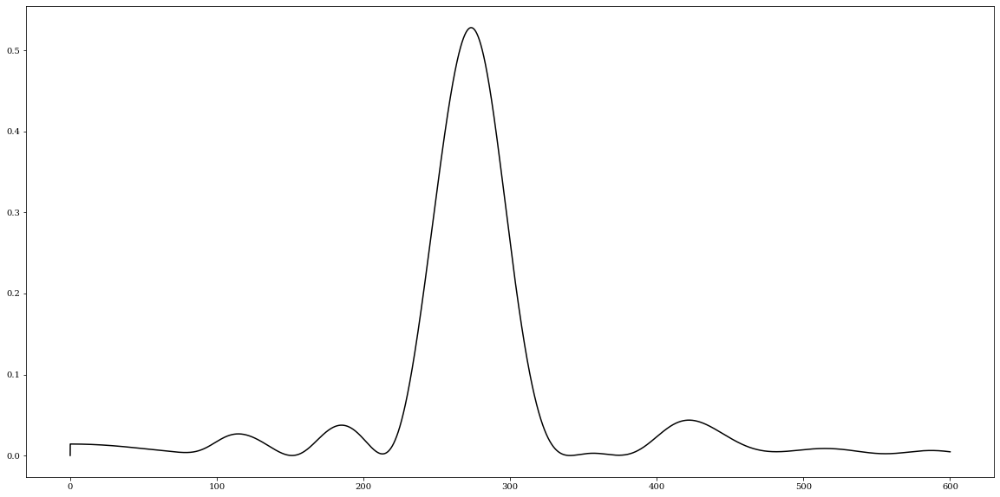

In [25]:
indata = np.loadtxt('J1252/sdss1252gr_4.dat', usecols=(0,1))
date = indata[:,0]
date = date-np.min(date)
flux = indata[:,1]
freq = np.linspace(0.0001,600,10000)
powerPl = LombScargle(date,flux).power(freq)
plt.figure(figsize=(20,10))
plt.plot(freq,powerPl, c='k')
print(freq[np.argmax(powerPl)])
plt.savefig('gr_4.pdf')